In [ ]:
#Manipulacion de datos
import numpy as np
import pandas as pd
import datetime

#Visualizacion de datos
import matplotlib.pyplot as plt
import seaborn as sns

#Proyección de datos
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.preprocessing import PolynomialFeatures
from sklearn.svm import SVC
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import confusion_matrix
from sklearn.metrics import precision_score

#webscrapping and advance ploting
import requests
import plotly.express as px

# **- Integrantes -** 

* Jean Yves Tovar Sánchez
* Pablo Calderón 

# Objetivos

**-General-**

* Aplicar los conocimientos adquiridos en el primer módulo del diplomado para obtener Estadística descriptiva y un Análisis exploratorio de Datos de una base de datos a elección.

  * **-Secundarios:-**
  * Usar la sintaxis adecuada en python para instalar lo necesario y aplicar las librerías, tales como numpy, pandas, matplotlib, seaborn y otras auxiliarias.
  * Obtener una base de datos de interés (nuestro caso, del INEGI) y construir otra(s) base(s) de datos adecuada(s) para su manipulación.
  * Manipular y limpiar la base de datos para extraer la información y crear gráficos que permitan aplicar estadística descriptiva de ella.
  * Concluir tendencias y resultados a partir de la estadística descriptiva. 

# Métodología

**-Manipulación de datos**
  * Crear df con el dataset  (periodo y numero de muertes desglosado en total, hombre mujer no especificado) vs entidad federativa

**-Análisis estadístico**
  * medias
  * desviaciones
  * agregar graficos https://www.python-graph-gallery.com/
  * histogramas y boxplot, violinplot
  * etc (seaborn y mathplot)

**-INEGI: 6 bases de datos disponibles: **
 * **-muertes totales  -**
 * diabetes 
 * cancer de mama  
 * cancer de prostata  
 * **-homicidio -**
 * **-suicidio-** 

**-EDA**
* ¿Correlación entre ellas?
* ¿Correlación con otra información (ej. densidad poblacional)

- Comparar con Muertes totales

- Comparar con df de Covid
 * Hay correlacion entre muertes covid y otras muertes 2020-2021
 * que tanto difieren o se acercan



### Se hizo mediante drive porque:
* 1. La pagina del inegi https://www.inegi.org.mx/temas/mortalidad/#Tabulados no permite obtener directamente el link de descarga de los archivos
* 2. Al cargar los archivos en github, algunas veces la funcion read_excel('file.xlsx') genera varios errores
* 3. Al tener que trabajarse de manera local y descargar los datos, se considero igual de efectivo usar drive que github

In [ ]:
#Cargamos la cuenta de google Drive donde se descargaron las bases de datos

from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


### Podemos sistematizarlo para que en la misma carpeta se encuentren diferentes bases de datos del inegi, y solo tengamos que cambiar el nombre del archivo 
* Las columnas deben tener el mismo orden de las entidades federativas, o adecuarlas para su manipulacion correcta

In [ ]:
# Hay que cuidar que la ruta del archivo coincida con la funcion del dataframe. 
#En este caso, en la carpeta principal se necesita hacer una carpeta llamada "DCDP Módulo 1 Trabajo Final" que debera contener el archivo "Mortalidad Inegi total.xlsx"
#Generamos el dataframe de las Muertes totales por entidad federativa

df=pd.read_excel("/content/drive/MyDrive/DCDP Módulo 1 Trabajo Final/Mortalidad Inegi total.xlsx")
df

,Entidad federativa de residencia habitual de la persona fallecida,Total,Hombres,Mujeres,No especificado,Total.1,Hombres.1,Mujeres.1,No especificado.1,Total.2,...,Mujeres.9,No especificado.9,Total.10,Hombres.10,Mujeres.10,No especificado.10,Total.11,Hombres.11,Mujeres.11,No especificado.11
0,Año,2010,2010,2010,2010,2011,2011,2011,2011,2012,...,2019,2019,2020,2020,2020,2020,2021,2021,2021,2021
1,Total,592018,332027,259669,322,590693,332646,257468,579,602354,...,325126,473,1086743,639277,446709,757,1122249,646825,474689,735
2,Aguascalientes,5177,2721,2449,7,4934,2679,2253,2,5267,...,3033,3,9548,5578,3968,2,9712,5457,4255,0
3,Baja California,15400,9561,5822,17,14922,9176,5736,10,14756,...,7837,1,32662,20190,12458,14,28596,17937,10655,4
4,Baja California Sur,2434,1478,954,2,2602,1523,1079,0,2739,...,1435,1,4867,2924,1943,0,5925,3605,2320,0
5,Campeche,3820,2231,1587,2,3736,2147,1587,2,3964,...,2195,1,7549,4430,3118,1,7509,4280,3225,4
6,Coahuila de Zaragoza,14593,8159,6432,2,14640,8345,6290,5,15200,...,8059,5,28190,16034,12149,7,23814,13362,10447,5
7,Colima,3223,1888,1334,1,3514,2051,1461,2,3717,...,1792,0,6057,3694,2363,0,7121,4271,2849,1
8,Chiapas,21721,12088,9631,2,21199,11702,9483,14,22411,...,12935,8,38908,22400,16503,5,39865,22329,17532,4
9,Chihuahua,25809,16861,8898,50,24121,15168,8939,14,22187,...,10118,4,39246,23657,15579,10,31716,18592,13110,14


In [ ]:
#Hacemos una copia para trabajar sobre ella
total_df=df.copy()
total_df.head(9)


,Entidad federativa de residencia habitual de la persona fallecida,Total,Hombres,Mujeres,No especificado,Total.1,Hombres.1,Mujeres.1,No especificado.1,Total.2,...,Mujeres.9,No especificado.9,Total.10,Hombres.10,Mujeres.10,No especificado.10,Total.11,Hombres.11,Mujeres.11,No especificado.11
0,Año,2010,2010,2010,2010,2011,2011,2011,2011,2012,...,2019,2019,2020,2020,2020,2020,2021,2021,2021,2021
1,Total,592018,332027,259669,322,590693,332646,257468,579,602354,...,325126,473,1086743,639277,446709,757,1122249,646825,474689,735
2,Aguascalientes,5177,2721,2449,7,4934,2679,2253,2,5267,...,3033,3,9548,5578,3968,2,9712,5457,4255,0
3,Baja California,15400,9561,5822,17,14922,9176,5736,10,14756,...,7837,1,32662,20190,12458,14,28596,17937,10655,4
4,Baja California Sur,2434,1478,954,2,2602,1523,1079,0,2739,...,1435,1,4867,2924,1943,0,5925,3605,2320,0
5,Campeche,3820,2231,1587,2,3736,2147,1587,2,3964,...,2195,1,7549,4430,3118,1,7509,4280,3225,4
6,Coahuila de Zaragoza,14593,8159,6432,2,14640,8345,6290,5,15200,...,8059,5,28190,16034,12149,7,23814,13362,10447,5
7,Colima,3223,1888,1334,1,3514,2051,1461,2,3717,...,1792,0,6057,3694,2363,0,7121,4271,2849,1
8,Chiapas,21721,12088,9631,2,21199,11702,9483,14,22411,...,12935,8,38908,22400,16503,5,39865,22329,17532,4


### Nota: automaticamente añade el sufijo "".nn" para las columnas repetidas "Total, Hombres, Mujeres". En este caso, el primero sin punto es del 2010 y, el ".1" es 2011 y asi hasta el "0.11" que es 2021. 

* Total.0 = Total 2010, 
* Total.1 = Total 2011,
*  ... , 
* Total.11 = Total 2021

In [ ]:

#Cambiaremos el nombre de la columna para que todo tenga el mismo formato  

total_df.rename(columns = {'Total':'Total.0'},inplace=True)
total_df.rename(columns = {'Hombres':'Hombres.0'},inplace=True)
total_df.rename(columns = {'Mujeres':'Mujeres.0'},inplace=True)
total_df.rename(columns = {'No especificado':'No especificado.0'},inplace=True)
total_df.rename(columns = {'Entidad federativa de residencia habitual de la persona fallecida':'Entidad federativa'},inplace=True)
total_df.head(9)


#por Simplicidad, se usara con estas columnas, sabiendo que significa cada columna. Se podrian modificar los nombres de las columnas para quedar por año:
#total_df.rename(columns = {'Total':'Total_2010','Total.1':'Total_2011','Total.2':'Total_2012','Total.3':'Total_2013','Total.4':'Total_2014','Total.5':'Total_2015','Total.6':'Total_2016','Total.7':'Total_2017','Total.8':'Total_2018','Total.9':'Total_2019','Total.10':'Total_2020','Total.11':'Total_2021'}, inplace =True) 
#total_df.rename(columns = {'Hombres':'Hombres_2010','Hombres.1':'Hombres_2011'... etc.

,Entidad federativa,Total.0,Hombres.0,Mujeres.0,No especificado.0,Total.1,Hombres.1,Mujeres.1,No especificado.1,Total.2,...,Mujeres.9,No especificado.9,Total.10,Hombres.10,Mujeres.10,No especificado.10,Total.11,Hombres.11,Mujeres.11,No especificado.11
0,Año,2010,2010,2010,2010,2011,2011,2011,2011,2012,...,2019,2019,2020,2020,2020,2020,2021,2021,2021,2021
1,Total,592018,332027,259669,322,590693,332646,257468,579,602354,...,325126,473,1086743,639277,446709,757,1122249,646825,474689,735
2,Aguascalientes,5177,2721,2449,7,4934,2679,2253,2,5267,...,3033,3,9548,5578,3968,2,9712,5457,4255,0
3,Baja California,15400,9561,5822,17,14922,9176,5736,10,14756,...,7837,1,32662,20190,12458,14,28596,17937,10655,4
4,Baja California Sur,2434,1478,954,2,2602,1523,1079,0,2739,...,1435,1,4867,2924,1943,0,5925,3605,2320,0
5,Campeche,3820,2231,1587,2,3736,2147,1587,2,3964,...,2195,1,7549,4430,3118,1,7509,4280,3225,4
6,Coahuila de Zaragoza,14593,8159,6432,2,14640,8345,6290,5,15200,...,8059,5,28190,16034,12149,7,23814,13362,10447,5
7,Colima,3223,1888,1334,1,3514,2051,1461,2,3717,...,1792,0,6057,3694,2363,0,7121,4271,2849,1
8,Chiapas,21721,12088,9631,2,21199,11702,9483,14,22411,...,12935,8,38908,22400,16503,5,39865,22329,17532,4


In [ ]:
#Podemos omitir el renglon del año
total_df = total_df.iloc[1:]
total_df.head()

,Entidad federativa,Total.0,Hombres.0,Mujeres.0,No especificado.0,Total.1,Hombres.1,Mujeres.1,No especificado.1,Total.2,...,Mujeres.9,No especificado.9,Total.10,Hombres.10,Mujeres.10,No especificado.10,Total.11,Hombres.11,Mujeres.11,No especificado.11
1,Total,592018,332027,259669,322,590693,332646,257468,579,602354,...,325126,473,1086743,639277,446709,757,1122249,646825,474689,735
2,Aguascalientes,5177,2721,2449,7,4934,2679,2253,2,5267,...,3033,3,9548,5578,3968,2,9712,5457,4255,0
3,Baja California,15400,9561,5822,17,14922,9176,5736,10,14756,...,7837,1,32662,20190,12458,14,28596,17937,10655,4
4,Baja California Sur,2434,1478,954,2,2602,1523,1079,0,2739,...,1435,1,4867,2924,1943,0,5925,3605,2320,0
5,Campeche,3820,2231,1587,2,3736,2147,1587,2,3964,...,2195,1,7549,4430,3118,1,7509,4280,3225,4


In [ ]:
#Si intentamos obtener los estadisticos directamente, tendremos errores asociados a los renglones no deseados (como el Total y No especificado)
total_df.describe()

,Total.0,Hombres.0,Mujeres.0,No especificado.0,Total.1,Hombres.1,Mujeres.1,No especificado.1,Total.2,Hombres.2,...,Mujeres.9,No especificado.9,Total.10,Hombres.10,Mujeres.10,No especificado.10,Total.11,Hombres.11,Mujeres.11,No especificado.11
count,35.000000,35.000000,35.000000,35.000000,35.000000,35.000000,35.000000,35.000000,35.000000,35.000000,...,35.000000,35.000000,3.500000e+01,35.000000,35.000000,35.000000,3.500000e+01,35.000000,35.000000,35.000000
mean,33829.600000,18972.971429,14838.228571,18.400000,33753.885714,19008.342857,14712.457143,33.085714,34420.228571,19335.828571,...,18578.628571,27.028571,6.209960e+04,36530.114286,25526.228571,43.257143,6.412851e+04,36961.428571,27125.085714,42.000000
std,98317.621281,55091.188611,43185.349372,53.991394,98123.090100,55210.159900,42826.581268,98.111393,100085.444127,56178.323158,...,54037.520536,95.884884,1.808509e+05,106382.763886,74354.069295,163.186891,1.866545e+05,107537.977534,79006.588979,155.962665
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,445.000000,0.000000,1.107000e+03,793.000000,312.000000,0.000000,1.661000e+03,1146.000000,515.000000,0.000000
25%,6949.500000,3960.000000,3075.500000,2.000000,6971.000000,4023.500000,3001.000000,3.000000,7059.500000,4028.500000,...,3703.500000,1.000000,1.312550e+04,8307.500000,5430.500000,1.000000,1.304050e+04,8066.000000,5664.500000,1.000000
50%,14593.000000,8159.000000,5839.000000,5.000000,14640.000000,8345.000000,5835.000000,10.000000,14344.000000,8707.000000,...,7336.000000,2.000000,2.442700e+04,14443.000000,10400.000000,3.000000,2.510600e+04,14515.000000,10447.000000,4.000000
75%,23639.000000,13410.500000,9833.500000,13.500000,23998.000000,13808.500000,9697.000000,23.500000,23188.000000,13504.500000,...,12568.500000,4.000000,3.907700e+04,23028.500000,16041.000000,7.000000,4.274550e+04,24325.000000,18411.500000,5.500000
max,592018.000000,332027.000000,259669.000000,322.000000,590693.000000,332646.000000,257468.000000,579.000000,602354.000000,338377.000000,...,325126.000000,473.000000,1.086743e+06,639277.000000,446709.000000,757.000000,1.122249e+06,646825.000000,474689.000000,735.000000


In [ ]:
#las regiones estan segun los estados en orden alfabetico
regiones= ["Republica mexicana", "Centronorte", "Noroeste", "Noroeste", "Sureste", "Noreste", "Oeste", "Suroeste", "Noroeste", "Centrosur", "Noroeste", "Centronorte", "Suroeste", "Este", "Oeste", "Centrosur", "Oeste", "Centrosur", "Oeste", "Noreste", "Suroeste", "Este", "Centronorte", "Sureste", "Centronorte", "Noroeste", "Noroeste", "Sureste", "Noreste", "Este", "Este", "Sureste", "Centronorte", "Extranjero", "No Especificado"]

#Añadimos la columna region
total_df["Region"]= regiones
total_df

,Entidad federativa,Total.0,Hombres.0,Mujeres.0,No especificado.0,Total.1,Hombres.1,Mujeres.1,No especificado.1,Total.2,...,No especificado.9,Total.10,Hombres.10,Mujeres.10,No especificado.10,Total.11,Hombres.11,Mujeres.11,No especificado.11,Region
1,Total,592018,332027,259669,322,590693,332646,257468,579,602354,...,473,1086743,639277,446709,757,1122249,646825,474689,735,Republica mexicana
2,Aguascalientes,5177,2721,2449,7,4934,2679,2253,2,5267,...,3,9548,5578,3968,2,9712,5457,4255,0,Centronorte
3,Baja California,15400,9561,5822,17,14922,9176,5736,10,14756,...,1,32662,20190,12458,14,28596,17937,10655,4,Noroeste
4,Baja California Sur,2434,1478,954,2,2602,1523,1079,0,2739,...,1,4867,2924,1943,0,5925,3605,2320,0,Noroeste
5,Campeche,3820,2231,1587,2,3736,2147,1587,2,3964,...,1,7549,4430,3118,1,7509,4280,3225,4,Sureste
6,Coahuila de Zaragoza,14593,8159,6432,2,14640,8345,6290,5,15200,...,5,28190,16034,12149,7,23814,13362,10447,5,Noreste
7,Colima,3223,1888,1334,1,3514,2051,1461,2,3717,...,0,6057,3694,2363,0,7121,4271,2849,1,Oeste
8,Chiapas,21721,12088,9631,2,21199,11702,9483,14,22411,...,8,38908,22400,16503,5,39865,22329,17532,4,Suroeste
9,Chihuahua,25809,16861,8898,50,24121,15168,8939,14,22187,...,4,39246,23657,15579,10,31716,18592,13110,14,Noroeste
10,Ciudad de México,55106,28098,26998,10,54629,28306,26298,25,55995,...,2,107292,61938,45353,1,100363,55694,44664,5,Centrosur


In [ ]:
total_df.Region.unique()

array(['Republica mexicana', 'Centronorte', 'Noroeste', 'Sureste',
       'Noreste', 'Oeste', 'Suroeste', 'Centrosur', 'Este', 'Extranjero',
       'No Especificado'], dtype=object)

In [ ]:
#Podemos obtener el total de muertes por region de la republica
total_df.groupby('Region').sum()

,Total.0,Hombres.0,Mujeres.0,No especificado.0,Total.1,Hombres.1,Mujeres.1,No especificado.1,Total.2,Hombres.2,...,Mujeres.9,No especificado.9,Total.10,Hombres.10,Mujeres.10,No especificado.10,Total.11,Hombres.11,Mujeres.11,No especificado.11
Region,,,,,,,,,,,,,,,,,,,,,
Centronorte,61936,33739,28171,26,60329,33326,26972,31,62891,34924,...,35226,16,115285,67738,47536,11,124157,71825,52320,12
Centrosur,133156,70930,62187,39,133666,71748,61825,93,138313,74613,...,76179,14,278402,164501,113891,10,274677,156979,117685,13
Este,94635,51208,43400,27,95282,52134,43096,52,98333,53749,...,54274,6,166191,94890,71291,10,182426,102128,80285,13
Extranjero,1132,811,321,0,1047,727,320,0,1095,756,...,445,0,1107,793,312,2,1661,1146,515,0
No Especificado,0,0,0,0,0,0,0,0,0,0,...,2418,334,12306,9645,2031,630,10466,8436,1441,589
Noreste,54909,31526,23333,50,55433,32268,23026,139,57021,33178,...,29527,13,98633,57107,41508,18,95709,54674,41013,22
Noroeste,83247,52064,31062,121,81340,49963,31199,178,77911,47091,...,37931,59,142496,85981,56468,47,129022,76862,52107,53
Oeste,72505,40632,31847,26,74014,41830,32155,29,74306,41836,...,38387,15,115840,67590,48238,12,138922,80854,58055,13
Republica mexicana,592018,332027,259669,322,590693,332646,257468,579,602354,338377,...,325126,473,1086743,639277,446709,757,1122249,646825,474689,735


([<matplotlib.patches.Wedge at 0x7fd48ce03940>,
 [Text(1.0851802351527373, 0.17995515339619944, ''),
  Text(0.8539655942648584, 0.6933561594244817, ''),
  Text(0.3086716247377617, 1.0558038776599328, ''),
  Text(0.03336052167215595, 1.0994940088939829, ''),
  Text(0.030058017444752345, 1.0995892485775274, ''),
  Text(-0.12989299513870078, 1.0923038999353145, ''),
  Text(-0.5127599450659388, 0.9731789345932101, ''),
  Text(-0.8604166554316955, 0.6853343556657109, ''),
  Text(-0.508186495535667, -0.9755749513774827, ''),
  Text(1.013557820903987, -0.42743484144880045, ''),
  Text(1.086130065406083, -0.17413064354380042, '')],
 [Text(0.5919164919014931, 0.09815735639792696, '5.23%'),
  Text(0.4657994150535591, 0.37819426877699, '11.25%'),
  Text(0.1683663407660518, 0.5758930241781451, '7.99%'),
  Text(0.018196648184812335, 0.5997240048512633, '0.10%'),
  Text(0.016395282242592187, 0.5997759537695603, '0.00%'),
  Text(-0.0708507246211095, 0.5958021272374442, '4.64%'),
  Text(-0.27968724276

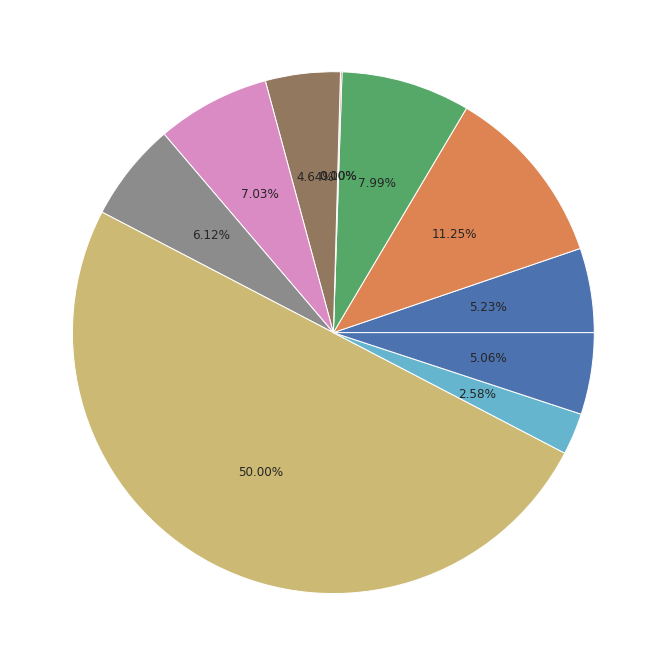

In [ ]:
#Intento de pie chart porcentual
plt.pie(total_df.groupby('Region').sum()['Total.0'], autopct = '%1.2f%%')

In [ ]:
total_df.columns

Index(['Entidad federativa', 'Total.0', 'Hombres.0', 'Mujeres.0',
       'No especificado.0', 'Total.1', 'Hombres.1', 'Mujeres.1',
       'No especificado.1', 'Total.2', 'Hombres.2', 'Mujeres.2',
       'No especificado.2', 'Total.3', 'Hombres.3', 'Mujeres.3',
       'No especificado.3', 'Total.4', 'Hombres.4', 'Mujeres.4',
       'No especificado.4', 'Total.5', 'Hombres.5', 'Mujeres.5',
       'No especificado.5', 'Total.6', 'Hombres.6', 'Mujeres.6',
       'No especificado.6', 'Total.7', 'Hombres.7', 'Mujeres.7',
       'No especificado.7', 'Total.8', 'Hombres.8', 'Mujeres.8',
       'No especificado.8', 'Total.9', 'Hombres.9', 'Mujeres.9',
       'No especificado.9', 'Total.10', 'Hombres.10', 'Mujeres.10',
       'No especificado.10', 'Total.11', 'Hombres.11', 'Mujeres.11',
       'No especificado.11', 'Region'],
      dtype='object')

<Axes: >

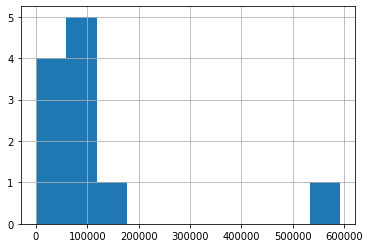

In [ ]:
# Si intentamos hacer un histograma de las defunciones por año para cada region o entidad, tenemos que modificar el df
# Aplicado directamente nos da informacion confusa
total_df.groupby('Region')['Total.0'].sum().hist()

In [ ]:
#Añadimos las columnas de muertes totales del 2010 al 2021 (Todos, hombres, mujeres)
total_df["Totales_2010-2021"]= total_df['Total.0']+total_df['Total.1']+total_df['Total.2']+total_df['Total.3']+total_df['Total.4']+total_df['Total.5']+total_df['Total.6']+total_df['Total.7']+total_df['Total.8']+total_df['Total.9']+total_df['Total.10']+total_df['Total.11']
total_df["Hombres_2010-2021"]= total_df['Hombres.0']+total_df['Hombres.1']+total_df['Hombres.2']+total_df['Hombres.3']+total_df['Hombres.4']+total_df['Hombres.5']+total_df['Hombres.6']+total_df['Hombres.7']+total_df['Hombres.8']+total_df['Hombres.9']+total_df['Hombres.10']+total_df['Hombres.11']
total_df["Mujeres_2010-2021"]= total_df['Mujeres.0']+total_df['Mujeres.1']+total_df['Mujeres.2']+total_df['Mujeres.3']+total_df['Mujeres.4']+total_df['Mujeres.5']+total_df['Mujeres.6']+total_df['Mujeres.7']+total_df['Mujeres.8']+total_df['Mujeres.9']+total_df['Mujeres.10']+total_df['Mujeres.11']

In [ ]:
#Intercambiamos el orden de las columnas, para que las recien añadidas aparezcan al inicio
#creamos la lista de los titulos en el orden
cols=['Entidad federativa', 'Region', 'Totales_2010-2021',
       'Hombres_2010-2021', 'Mujeres_2010-2021',
       'Total.0', 'Hombres.0', 'Mujeres.0', 'No especificado.0', 'Total.1',
       'Hombres.1', 'Mujeres.1', 'No especificado.1', 'Total.2', 'Hombres.2',
       'Mujeres.2', 'No especificado.2', 'Total.3', 'Hombres.3', 'Mujeres.3',
       'No especificado.3', 'Total.4', 'Hombres.4', 'Mujeres.4',
       'No especificado.4', 'Total.5', 'Hombres.5', 'Mujeres.5',
       'No especificado.5', 'Total.6', 'Hombres.6', 'Mujeres.6',
       'No especificado.6', 'Total.7', 'Hombres.7', 'Mujeres.7',
       'No especificado.7', 'Total.8', 'Hombres.8', 'Mujeres.8',
       'No especificado.8', 'Total.9', 'Hombres.9', 'Mujeres.9',
       'No especificado.9', 'Total.10', 'Hombres.10', 'Mujeres.10',
       'No especificado.10', 'Total.11', 'Hombres.11', 'Mujeres.11',
       'No especificado.11']

#cambiamos el df al nuevo orden de columna       
total_df=total_df[cols]
total_df

,Entidad federativa,Region,Totales_2010-2021,Hombres_2010-2021,Mujeres_2010-2021,Total.0,Hombres.0,Mujeres.0,No especificado.0,Total.1,...,Mujeres.9,No especificado.9,Total.10,Hombres.10,Mujeres.10,No especificado.10,Total.11,Hombres.11,Mujeres.11,No especificado.11
1,Total,Republica mexicana,8766193,4959890,3800627,592018,332027,259669,322,590693,...,325126,473,1086743,639277,446709,757,1122249,646825,474689,735
2,Aguascalientes,Centronorte,76425,42144,34253,5177,2721,2449,7,4934,...,3033,3,9548,5578,3968,2,9712,5457,4255,0
3,Baja California,Noroeste,234384,145094,89138,15400,9561,5822,17,14922,...,7837,1,32662,20190,12458,14,28596,17937,10655,4
4,Baja California Sur,Noroeste,41337,25079,16251,2434,1478,954,2,2602,...,1435,1,4867,2924,1943,0,5925,3605,2320,0
5,Campeche,Sureste,59199,34002,25150,3820,2231,1587,2,3736,...,2195,1,7549,4430,3118,1,7509,4280,3225,4
6,Coahuila de Zaragoza,Noreste,212858,118629,94111,14593,8159,6432,2,14640,...,8059,5,28190,16034,12149,7,23814,13362,10447,5
7,Colima,Oeste,53798,32388,21390,3223,1888,1334,1,3514,...,1792,0,6057,3694,2363,0,7121,4271,2849,1
8,Chiapas,Suroeste,327569,180982,146510,21721,12088,9631,2,21199,...,12935,8,38908,22400,16503,5,39865,22329,17532,4
9,Chihuahua,Noroeste,305974,183484,122243,25809,16861,8898,50,24121,...,10118,4,39246,23657,15579,10,31716,18592,13110,14
10,Ciudad de México,Centrosur,799642,423449,376069,55106,28098,26998,10,54629,...,30308,2,107292,61938,45353,1,100363,55694,44664,5


In [ ]:
#Ahora si podemos extraer informacion de los promedios de defunciones por periodo, para todos, para hombres y/o para mujeres
total_df.describe()

,Totales_2010-2021,Hombres_2010-2021,Mujeres_2010-2021,Total.0,Hombres.0,Mujeres.0,No especificado.0,Total.1,Hombres.1,Mujeres.1,...,Mujeres.9,No especificado.9,Total.10,Hombres.10,Mujeres.10,No especificado.10,Total.11,Hombres.11,Mujeres.11,No especificado.11
count,3.500000e+01,3.500000e+01,3.500000e+01,35.000000,35.000000,35.000000,35.000000,35.000000,35.000000,35.000000,...,35.000000,35.000000,3.500000e+01,35.000000,35.000000,35.000000,3.500000e+01,35.000000,35.000000,35.000000
mean,5.009253e+05,2.834223e+05,2.171787e+05,33829.600000,18972.971429,14838.228571,18.400000,33753.885714,19008.342857,14712.457143,...,18578.628571,27.028571,6.209960e+04,36530.114286,25526.228571,43.257143,6.412851e+04,36961.428571,27125.085714,42.000000
std,1.456343e+06,8.234267e+05,6.320694e+05,98317.621281,55091.188611,43185.349372,53.991394,98123.090100,55210.159900,42826.581268,...,54037.520536,95.884884,1.808509e+05,106382.763886,74354.069295,163.186891,1.866545e+05,107537.977534,79006.588979,155.962665
min,1.449700e+04,1.011000e+04,4.384000e+03,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,445.000000,0.000000,1.107000e+03,793.000000,312.000000,0.000000,1.661000e+03,1146.000000,515.000000,0.000000
25%,1.027355e+05,5.811350e+04,4.475700e+04,6949.500000,3960.000000,3075.500000,2.000000,6971.000000,4023.500000,3001.000000,...,3703.500000,1.000000,1.312550e+04,8307.500000,5430.500000,1.000000,1.304050e+04,8066.000000,5664.500000,1.000000
50%,2.032040e+05,1.186290e+05,8.640900e+04,14593.000000,8159.000000,5839.000000,5.000000,14640.000000,8345.000000,5835.000000,...,7336.000000,2.000000,2.442700e+04,14443.000000,10400.000000,3.000000,2.510600e+04,14515.000000,10447.000000,4.000000
75%,3.349500e+05,1.892685e+05,1.468630e+05,23639.000000,13410.500000,9833.500000,13.500000,23998.000000,13808.500000,9697.000000,...,12568.500000,4.000000,3.907700e+04,23028.500000,16041.000000,7.000000,4.274550e+04,24325.000000,18411.500000,5.500000
max,8.766193e+06,4.959890e+06,3.800627e+06,592018.000000,332027.000000,259669.000000,322.000000,590693.000000,332646.000000,257468.000000,...,325126.000000,473.000000,1.086743e+06,639277.000000,446709.000000,757.000000,1.122249e+06,646825.000000,474689.000000,735.000000


#Estadistica
Calcularemos el promedio de cada año y se comparara por **año**

<Axes: xlabel='Totales_2010-2021', ylabel='Region'>

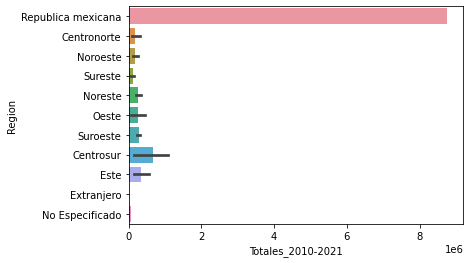

In [ ]:
#Grafico de barras nos ayudara a visualizar la distribucion de datos. Al considerar el total de la republica, la escala puede dificultar el analisis visual
sns.barplot(x=total_df['Totales_2010-2021'], y=total_df['Region'])

In [ ]:
#Primero agrupamos por region y calculamos el promedio de muertes entre 2010 y 2021, para los tres (total, mujeres y hombres)
data1=total_df.groupby('Region')['Totales_2010-2021'].agg('mean')
data2=total_df.groupby('Region')['Mujeres_2010-2021'].agg('mean')
data3=total_df.groupby('Region')['Hombres_2010-2021'].agg('mean')
#Como el valor de las defunciones en todo el pais (republica mexicana) es muy alto comparado con el resto (porque es el acumulado), lo omitimos para que no se desproporcione la grafica
data1t=data1.drop(['Republica mexicana'])
data2t=data2.drop(['Republica mexicana'])
data3t=data3.drop(['Republica mexicana'])
#Finalmente creamos un dataframe que sera el que graficaremos
data_tot=[data1t,data2t,data3t]
data_tot1=[data1,data2,data3]
#data_tot=pd.DataFrame(data_tot)

#Nos quedamos con el dataframe que no tiene los valores acumulados de la Republica completa
data_tot1=pd.DataFrame(data_tot1)


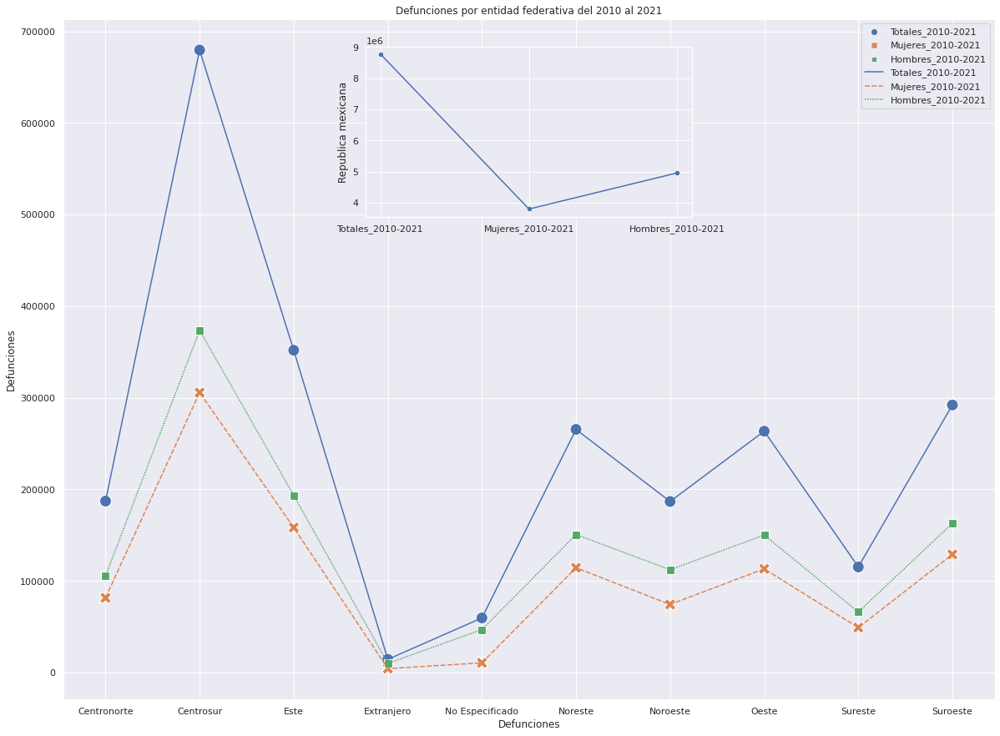

In [ ]:
g, ax = plt.subplots()
g=sns.set(rc={'figure.figsize':(20,15)})
g=sns.scatterplot(data_tot,s=200)
g=sns.lineplot(data_tot)
g.set(ylabel='Defunciones')
g.set(title='Defunciones por entidad federativa del 2010 al 2021')

#Añadimos un inset de los valores de toda la republica, para no alterar la escala general

from mpl_toolkits.axes_grid1.inset_locator import inset_axes
ax.xaxis.set_label_text('Defunciones')
axins = inset_axes(ax,  "35%", "25%" ,loc="upper center", borderpad=3)
sns.scatterplot(data_tot1['Republica mexicana'], ax=axins)
sns.lineplot(data_tot1['Republica mexicana'], ax=axins)
plt.show()

Podemos apreciar que la region con mayor numero de defunciones totales entre 2010 y 2021 es en el Centro sur del país, que comprende a los estados de:
* Ciudad de Mexico
* Estado de Mexico
* Morelos

Valdría la pena estudiar la densidad poblacional y correlacionarla con los datos obtenidos, así como índices de salud y violencia. (Será para otra ocasión)

Mediante las graficas de cajas y de violin, podemos apreciar visualmente la variacion en la distribucion de los datos, así como la comparación directa entre los promedios, cuartiles y anchos de distribución.

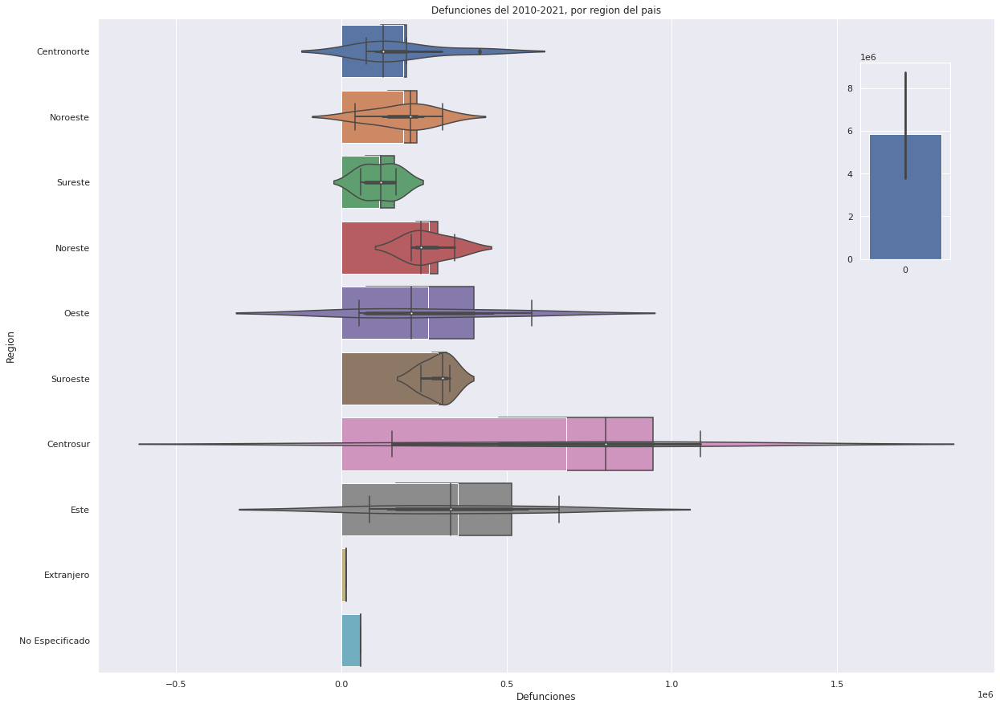

In [ ]:
g, ax = plt.subplots()

g=sns.set(rc={'figure.figsize':(30,30)},)
g=sns.barplot(x=total_df['Totales_2010-2021'],y=total_df['Region'][1:])
g=sns.boxplot(x=total_df['Totales_2010-2021'],y=total_df['Region'][1:])
g=sns.violinplot(x=total_df['Totales_2010-2021'],y=total_df['Region'][1:])
g.set(xlabel='Defunciones')
g.set(title='Defunciones del 2010-2021, por region del pais')

#Falta añadir un inset de los valores de toda la republica


axins = inset_axes(ax,  "10%", "30%" ,loc="upper right", borderpad=5)
sns.barplot(data_tot1['Republica mexicana'], ax=axins)
ax.xaxis.set_label_text('Defunciones')
plt.show()

Respecto al total de defunciones por entidad federativa, tenemos la siguiente distribución:

<Axes: xlabel='Totales_2010-2021', ylabel='Entidad federativa'>

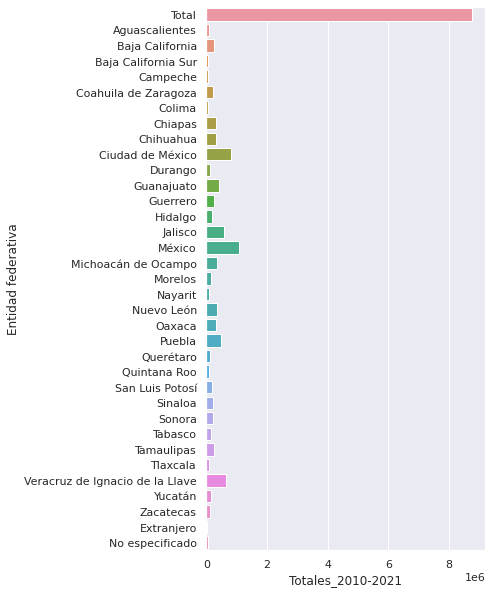

In [ ]:
sns.set(rc={'figure.figsize':(5,10)})
sns.barplot(x=total_df['Totales_2010-2021'],y=total_df['Entidad federativa'])


Si omitimos la información del total de la república, podemos apreciar con mas detalle las variaciones de las defunciones entre estados

[Text(0.5, 0, 'Defunciones'), Text(0, 0.5, 'Entidad federativa')]

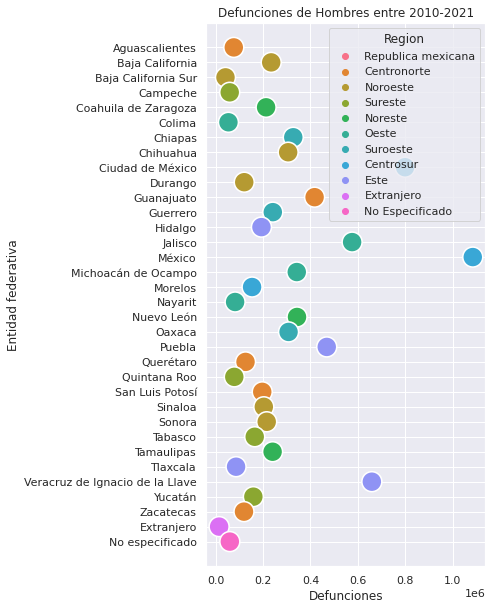

In [ ]:
sns.set(rc={'figure.figsize':(5,10)})
g=sns.scatterplot(x=total_df['Totales_2010-2021'],y=total_df['Entidad federativa'][1:], hue=total_df['Region'], s=400)
g.set_title('Defunciones de Hombres entre 2010-2021')
g.set(xlabel='Defunciones', ylabel='Entidad federativa')

<Axes: xlabel='Hombres_2010-2021', ylabel='Entidad federativa'>

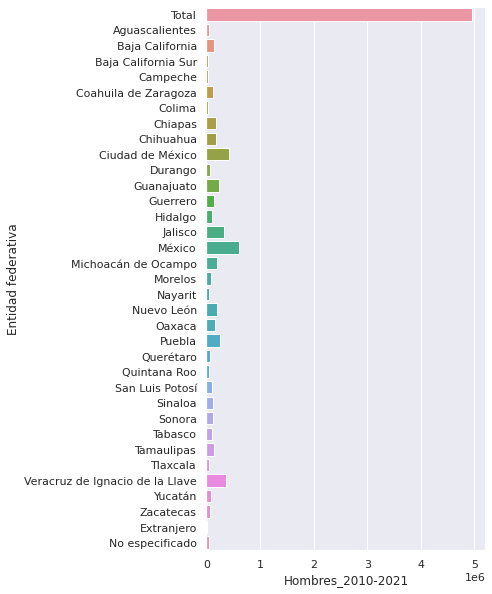

In [ ]:
sns.set(rc={'figure.figsize':(5,10)})
sns.barplot(x=total_df['Hombres_2010-2021'],y=total_df['Entidad federativa'])


[Text(0.5, 0, 'Defunciones'), Text(0, 0.5, 'Entidad federativa')]

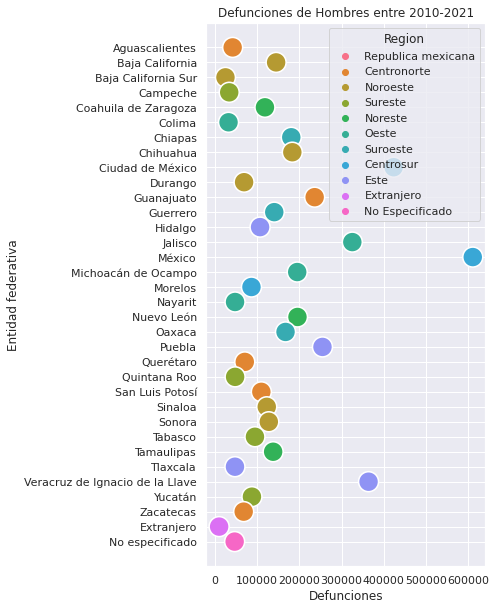

In [ ]:
sns.set(rc={'figure.figsize':(5,10)})
g= sns.scatterplot(x=total_df['Hombres_2010-2021'],y=total_df['Entidad federativa'][1:], hue=total_df['Region'], s=400)
g.set_title('Defunciones de Hombres entre 2010-2021')
g.set(xlabel='Defunciones', ylabel='Entidad federativa')


<Axes: xlabel='Mujeres_2010-2021', ylabel='Entidad federativa'>

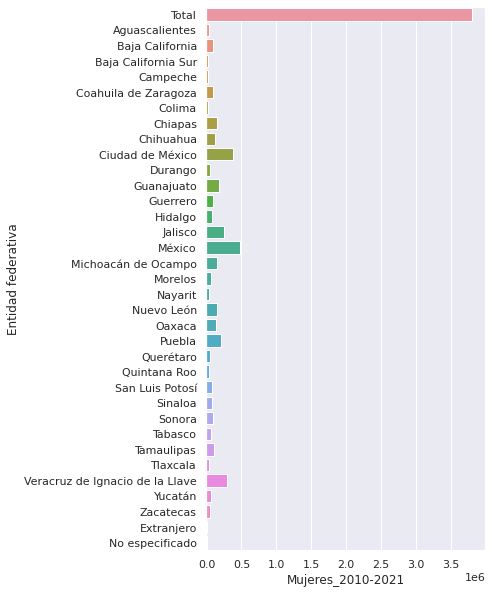

In [ ]:
sns.set(rc={'figure.figsize':(5,10)})
sns.barplot(x=total_df['Mujeres_2010-2021'],y=total_df['Entidad federativa'])


[Text(0.5, 0, 'Defunciones'), Text(0, 0.5, 'Entidad federativa')]

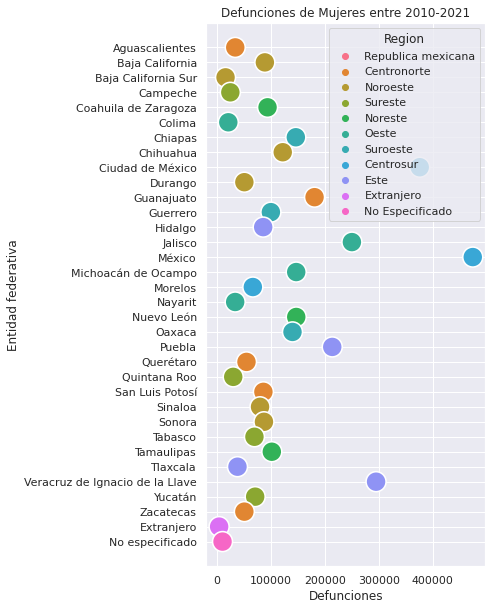

In [ ]:
sns.set(rc={'figure.figsize':(5,10)})
g=sns.scatterplot(x=total_df['Mujeres_2010-2021'],y=total_df['Entidad federativa'][1:], hue=total_df['Region'], s=400)
g.set_title('Defunciones de Mujeres entre 2010-2021')
g.set(xlabel='Defunciones', ylabel='Entidad federativa')


Para todos los casos, el estado con mayor numero de defunciones es el Estado de México. Otra vez, valdría la pena comparar con la densidad poblacional y los principales motivos de defunción.

### Estadistica por año

Para graficar la informacion de defunciones por año, para cada entidad federativa, es necesario modificar el df: ordenarlo y clasificarlo por año

In [ ]:
#Creamos las etiquetas de las columnas, para despues mandarlas a llamar del df
#Estas columnas serán las etiquetas que definen la poblacion (Total, Hombre, Mujer) y el año (2010-2021) seleccionados

#Recordemos que la terminacion ".xx" refiere al año "20xx"
cols_t= ["Total.0","Total.1","Total.2","Total.3","Total.4","Total.5","Total.6","Total.7","Total.8","Total.9","Total.10","Total.11"]
cols_h= ["Hombres.0","Hombres.1","Hombres.2","Hombres.3","Hombres.4","Hombres.5","Hombres.6","Hombres.7","Hombres.8","Hombres.9","Hombres.10","Hombres.11"]
cols_m= ["Mujeres.0","Mujeres.1","Mujeres.2","Mujeres.3","Mujeres.4","Mujeres.5","Mujeres.6","Mujeres.7","Mujeres.8","Mujeres.9","Mujeres.10","Mujeres.11"]

#Juntamos las tres columnas para visualizarlas
cols_thm=[cols_t,cols_h,cols_m]
cols_thm


[['Total.0',
  'Total.1',
  'Total.2',
  'Total.3',
  'Total.4',
  'Total.5',
  'Total.6',
  'Total.7',
  'Total.8',
  'Total.9',
  'Total.10',
  'Total.11'],
 ['Hombres.0',
  'Hombres.1',
  'Hombres.2',
  'Hombres.3',
  'Hombres.4',
  'Hombres.5',
  'Hombres.6',
  'Hombres.7',
  'Hombres.8',
  'Hombres.9',
  'Hombres.10',
  'Hombres.11'],
 ['Mujeres.0',
  'Mujeres.1',
  'Mujeres.2',
  'Mujeres.3',
  'Mujeres.4',
  'Mujeres.5',
  'Mujeres.6',
  'Mujeres.7',
  'Mujeres.8',
  'Mujeres.9',
  'Mujeres.10',
  'Mujeres.11']]

In [ ]:
#Creamos nuevos dataframes que solo contengan los datos de cada clase (todos, hombre, mujer) por año
#usamos como etiquetas a nuestras columnas del paso anterior
t_1021_df=total_df[cols_t]
h_1021_df=total_df[cols_h]
m_1021_df=total_df[cols_m]

#Vamos a cambiar el nombre de las columnas con la nomenclatura "columna".xx al año "20xx"
periodo=['2010','2011','2012','2013','2014','2015','2016','2017','2018','2019','2020','2021']

t_1021_df.columns=periodo
h_1021_df.columns=periodo
m_1021_df.columns=periodo


m_1021_df.head()

,2010,2011,2012,2013,2014,2015,2016,2017,2018,2019,2020,2021
1,259669,257468,263440,275231,281279,291637,302599,308281,314499,325126,446709,474689
2,2449,2253,2430,2547,2464,2568,2711,2783,2792,3033,3968,4255
3,5822,5736,5708,6248,6354,6677,6841,7198,7604,7837,12458,10655
4,954,1079,1096,1119,1119,1249,1197,1333,1407,1435,1943,2320
5,1587,1587,1629,1762,1848,2060,2052,2029,2058,2195,3118,3225


In [ ]:
#los tres df estan ordenados por entidad federativa
entidades=pd.DataFrame(total_df['Entidad federativa'])
t_1021_df=entidades.join(t_1021_df)
h_1021_df=entidades.join(h_1021_df)
m_1021_df=entidades.join(m_1021_df)


In [ ]:
entidades

,Entidad federativa
1,Total
2,Aguascalientes
3,Baja California
4,Baja California Sur
5,Campeche
6,Coahuila de Zaragoza
7,Colima
8,Chiapas
9,Chihuahua
10,Ciudad de México


In [ ]:
#Asi obtenemos nuestro df ordenado por año, en este caso para defunciones totales por entidad federativa
t_1021_df.head()

,Entidad federativa,2010,2011,2012,2013,2014,2015,2016,2017,2018,2019,2020,2021
1,Total,592018,590693,602354,623599,633641,655688,685766,703047,722611,747784,1086743,1122249
2,Aguascalientes,5177,4934,5267,5522,5567,5636,5910,6158,6226,6768,9548,9712
3,Baja California,15400,14922,14756,15947,16198,17152,18253,19073,20501,20924,32662,28596
4,Baja California Sur,2434,2602,2739,2757,2826,3175,3183,3826,3447,3556,4867,5925
5,Campeche,3820,3736,3964,4139,4249,4714,4932,4631,4835,5121,7549,7509


In [ ]:
t_1021_df.describe()

,2010,2011,2012,2013,2014,2015,2016,2017,2018,2019,2020,2021
count,35.000000,35.000000,35.000000,35.000000,35.000000,35.000000,35.000000,35.000000,35.000000,35.000000,3.500000e+01,3.500000e+01
mean,33829.600000,33753.885714,34420.228571,35634.228571,36208.057143,37467.885714,39186.628571,40174.114286,41292.057143,42730.514286,6.209960e+04,6.412851e+04
std,98317.621281,98123.090100,100085.444127,103598.529298,105287.891817,108913.796209,113918.601816,116710.908960,119935.853741,124115.883911,1.808509e+05,1.866545e+05
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1290.000000,1127.000000,1456.000000,1.107000e+03,1.661000e+03
25%,6949.500000,6971.000000,7059.500000,7444.500000,7360.000000,7512.500000,8086.000000,8679.000000,9453.500000,10059.000000,1.312550e+04,1.304050e+04
50%,14593.000000,14640.000000,14344.000000,14848.000000,14881.000000,15357.000000,16128.000000,16279.000000,16681.000000,16697.000000,2.442700e+04,2.510600e+04
75%,23639.000000,23998.000000,23188.000000,23791.500000,24624.500000,25280.000000,26360.000000,26953.000000,27271.000000,28649.500000,3.907700e+04,4.274550e+04
max,592018.000000,590693.000000,602354.000000,623599.000000,633641.000000,655688.000000,685766.000000,703047.000000,722611.000000,747784.000000,1.086743e+06,1.122249e+06


In [ ]:
#De nuevo, el primer renglon puede meter ruido a la hora de extraer los estadisticos directamente
t_1021_df[1:].describe()

,2010,2011,2012,2013,2014,2015,2016,2017,2018,2019,2020,2021
count,34.000000,34.000000,34.000000,34.000000,34.00000,34.000000,34.000000,34.000000,34.000000,34.000000,34.000000,34.000000
mean,17412.294118,17373.323529,17716.294118,18341.147059,18636.50000,19284.941176,20169.588235,20677.852941,21253.264706,21993.647059,31963.029412,33007.323529
std,15489.799822,15621.115036,16092.319893,16551.100039,16953.07002,17301.373568,18151.147392,18094.723452,18445.986387,19101.460744,30780.755450,31143.613120
min,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,1290.000000,1127.000000,1456.000000,1107.000000,1661.000000
25%,6442.250000,6530.000000,6391.750000,6739.750000,6687.50000,6849.750000,7344.000000,8294.000000,9382.250000,10024.500000,12715.750000,12685.750000
50%,13941.500000,13895.000000,13852.500000,14595.500000,14712.00000,14976.000000,15759.500000,16214.000000,16552.500000,16596.500000,24194.500000,24460.000000
75%,22767.250000,23234.500000,22355.000000,22919.250000,24125.50000,24898.750000,25717.250000,26418.500000,26715.500000,27760.250000,38334.500000,40159.000000
max,68286.000000,69384.000000,72001.000000,74566.000000,76581.00000,77813.000000,82351.000000,83780.000000,86654.000000,89390.000000,152668.000000,152090.000000


In [ ]:
#Trasponemos para tener como clase a los años
df1=t_1021_df.T[1:]
df1.columns=entidades
df1

,"(Total,)","(Aguascalientes,)","(Baja California,)","(Baja California Sur,)","(Campeche,)","(Coahuila de Zaragoza,)","(Colima,)","(Chiapas,)","(Chihuahua,)","(Ciudad de México,)",...,"(Sinaloa,)","(Sonora,)","(Tabasco,)","(Tamaulipas,)","(Tlaxcala,)","(Veracruz de Ignacio de la Llave,)","(Yucatán,)","(Zacatecas,)","(Extranjero,)","(No especificado,)"
2010,592018,5177,15400,2434,3820,14593,3223,21721,25809,55106,...,15467,14916,11156,17200,5535,45079,11172,8373,1132,0
2011,590693,4934,14922,2602,3736,14640,3514,21199,24121,54629,...,15669,14752,10715,16880,5471,45417,10763,7988,1047,0
2012,602354,5267,14756,2739,3964,15200,3717,22411,22187,55995,...,14344,15001,10834,17856,5659,47585,10954,8414,1095,0
2013,623599,5522,15947,2757,4139,15716,3790,23121,22314,57142,...,14848,15451,11738,18163,5869,48495,11606,8970,1104,0
2014,633641,5567,16198,2826,4249,16466,3790,24568,22163,58870,...,14881,16041,12120,18611,5931,49440,11819,8705,1054,0
2015,655688,5636,17152,3175,4714,16167,4408,26519,22416,59484,...,15357,16507,12666,18700,6110,52354,13282,8838,1095,0
2016,685766,5910,18253,3183,4932,16605,4486,26691,23400,62230,...,16128,16807,13263,19334,6602,53749,13080,9608,1329,0
2017,703047,6158,19073,3826,4631,16660,4593,26986,23802,61984,...,16279,16729,13016,19587,6591,52820,12636,9497,1290,7909
2018,722611,6226,20501,3447,4835,17013,4533,27263,23836,63213,...,16011,17644,13548,19596,6946,53395,13017,9596,1127,16681
2019,747784,6768,20924,3556,5121,17794,4566,28317,24964,63334,...,16496,18485,14679,19703,6952,57220,13483,9990,1456,12327


In [ ]:
df1.index

Index(['2010', '2011', '2012', '2013', '2014', '2015', '2016', '2017', '2018',
       '2019', '2020', '2021'],
      dtype='object')

### Graficas de defuncion como funcion del tiempo (en años)

[Text(0.5, 0, 'Año'), Text(0, 0.5, 'Defunciones')]

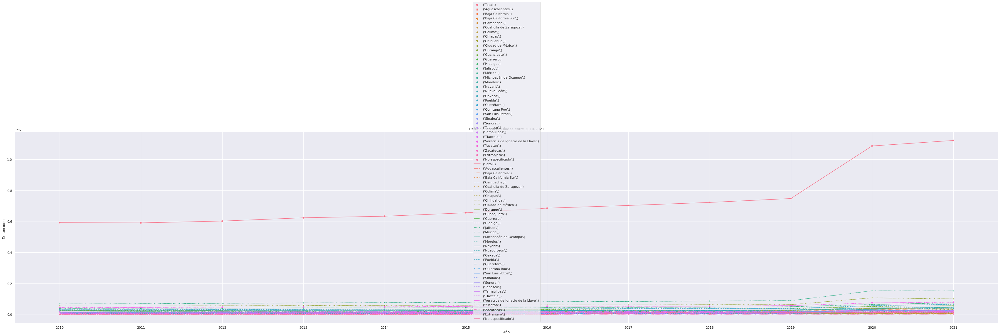

In [ ]:
sns.set(rc={'figure.figsize':(60,12)})
g=sns.scatterplot(df1)
g=sns.lineplot(df1)
g.set_title('Defunciones acumuladas entre 2010-2021')
g.set(xlabel='Año', ylabel='Defunciones')


Graficar todos juntos simultaneamente resulta complicado de comparar, asi que lo seccionaremos

In [ ]:
df2=df1[df1.columns[:1]]
df3=df1[df1.columns[1:10]]
df4=df1[df1.columns[10:20]]
df5=df1[df1.columns[20:30]]      
df6=df1[df1.columns[20:]]


[Text(0.5, 0, 'Año'), Text(0, 0.5, 'Defunciones')]

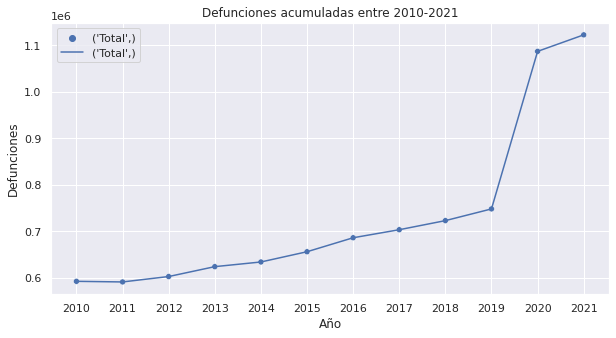

In [ ]:
#Defunciones totales
sns.set(rc={'figure.figsize':(10,5)})
g=sns.scatterplot(df2)
g=sns.lineplot(df2)
g.set_title('Defunciones acumuladas entre 2010-2021')
g.set(xlabel='Año', ylabel='Defunciones')


[Text(0.5, 0, 'Año'), Text(0, 0.5, 'Defunciones')]

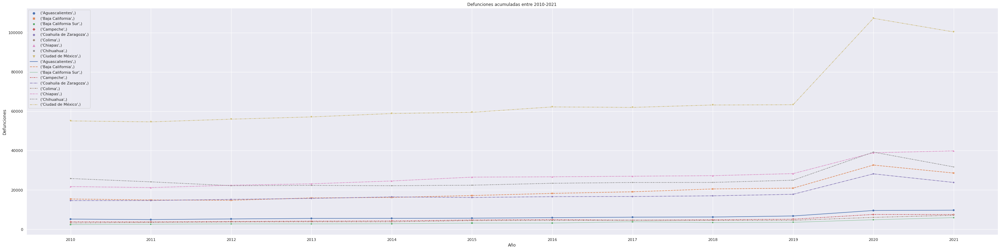

In [ ]:
#Defunciones para los primeros 10 estados ordenados alfabeticamente
sns.set(rc={'figure.figsize':(50,12)})
g=sns.scatterplot(df3)
g=sns.lineplot(df3)
g.set_title('Defunciones acumuladas entre 2010-2021')
g.set(xlabel='Año', ylabel='Defunciones')

[Text(0.5, 0, 'Año'), Text(0, 0.5, 'Defunciones')]

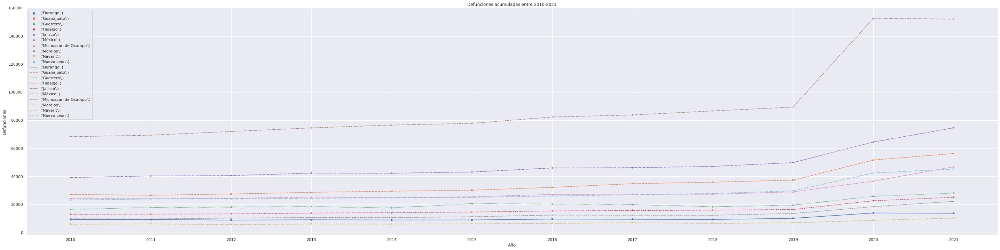

In [ ]:
sns.set(rc={'figure.figsize':(50,12)})
g=sns.scatterplot(df4)
g=sns.lineplot(df4)
g.set_title('Defunciones acumuladas entre 2010-2021')
g.set(xlabel='Año', ylabel='Defunciones')


[Text(0.5, 0, 'Año'), Text(0, 0.5, 'Defunciones')]

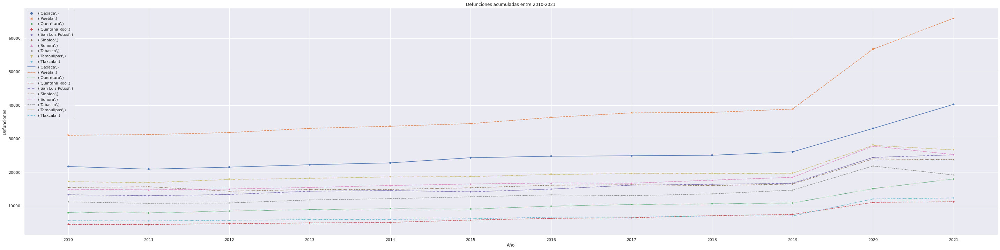

In [ ]:
sns.set(rc={'figure.figsize':(50,12)})
g=sns.scatterplot(df5)
g=sns.lineplot(df5)
g.set_title('Defunciones acumuladas entre 2010-2021')
g.set(xlabel='Año', ylabel='Defunciones')


[Text(0.5, 0, 'Año'), Text(0, 0.5, 'Defunciones')]

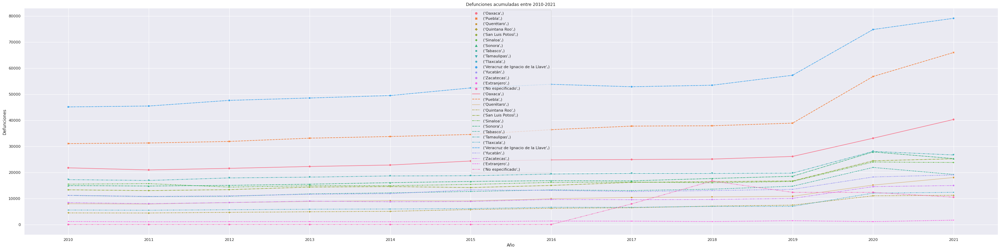

In [ ]:
sns.set(rc={'figure.figsize':(50,12)})
g=sns.scatterplot(df6)
g=sns.lineplot(df6)
g.set_title('Defunciones acumuladas entre 2010-2021')
g.set(xlabel='Año', ylabel='Defunciones')


# Suicidios y Homicidios 

## Importacion de datos

In [ ]:
## Lectura de datos 
!curl --remote-name \
     -H 'Accept: application/vnd.github.v3.raw' \
     --location https://github.com/PabloCGar/DCDP_JPCG/blob/main/suicidioMortalidad.xlsm
## Impresion de dimensiones

###Importamos datos a la sesión desde github

  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
100  134k    0  134k    0     0   346k      0 --:--:-- --:--:-- --:--:--  346k


In [ ]:
## Lectura de datos 
!curl --remote-name \
     -H 'Accept: application/vnd.github.v3.raw' \
     --location https://raw.github.com/PabloCGar/DCDP_JPCG/blob/main/homicidioMortalidad.xlsm
## Impresion de dimensiones


  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
  0     0    0     0    0     0      0      0 --:--:-- --:--:-- --:--:--     0
100    14  100    14    0     0     47      0 --:--:-- --:--:-- --:--:--    47


In [ ]:
df_mt_su=pd.read_excel("/content/drive/MyDrive/suicidioMortalidad.xlsm")

df_mt_ho=pd.read_excel("/content/drive/MyDrive/homicidioMortalidad.xlsm")

#Generamos los data frames apartir de los archivos mencionados
##Montando el Drive asociado podemos obtener un path para introducir la informacion a la sesión
##Al tener un archivo extensión xlsm, debemos usar la funcion read_excel()

In [ ]:
df_mt_ho.head()

,Entidad de registro/Homicidios,Total 2010,Hombres,Mujeres,No especificado,Total 2011,Hombres.1,Mujeres.1,No especificado.1,Total 2012,...,Mujeres.9,No especificado.9,Total 2020,Hombres.10,Mujeres.10,No especificado.10,Total 2021,Hombres.11,Mujeres.11,No especificado.11
0,Total,25757,23285,2418,54,27213,24257,2693,263,25967,...,3893,238,36773,32336,3957,480,35700,31263,4002,435
1,Aguascalientes,75,65,10,0,82,69,13,0,45,...,11,1,93,86,7,0,103,90,13,0
2,Baja California,1528,1408,117,3,809,708,94,7,581,...,264,90,2967,2563,298,106,3248,2754,349,145
3,Baja California Sur,55,45,10,0,42,34,8,0,37,...,16,1,78,71,7,0,77,65,11,1
4,Campeche,48,39,9,0,47,39,8,0,80,...,10,0,76,69,7,0,107,93,14,0


In [ ]:
df_mt_su.head()

,Entidad de registro/Suicidios,Total 2010,Hombres,Mujeres,No especificado,Total 2011,Hombres.1,Mujeres.1,No especificado.1,Total 2012,...,Mujeres.9,No especificado.9,Total 2020,Hombres.10,Mujeres.10,No especificado.10,Total 2021,Hombres.11,Mujeres.11,No especificado.11
0,Total,5012,4091,921,0,5718,4621,1095,2,5549,...,1313,4,7896,6452,1436,8,8432,6850,1568,14
1,Aguascalientes,50,41,9,0,98,81,17,0,116,...,28,0,181,157,24,0,174,143,31,0
2,Baja California,107,91,16,0,149,132,16,1,113,...,26,0,97,87,10,0,121,104,17,0
3,Baja California Sur,45,43,2,0,30,24,6,0,44,...,3,0,67,59,8,0,58,53,5,0
4,Campeche,62,53,9,0,81,71,10,0,63,...,10,0,70,48,22,0,110,91,19,0


In [ ]:
total_suicidios = df_mt_su.copy()
total_homicidios = df_mt_ho.copy()

In [ ]:
##renombramos columnas
total_suicidios.rename(columns = {'Hombres':'Hombres.0'},inplace=True)
total_suicidios.rename(columns = {'Mujeres':'Mujeres.0'},inplace=True)
total_suicidios.rename(columns = {'No especificado':'No especificado.0'},inplace=True)

total_homicidios.rename(columns = {'Hombres':'Hombres.0'},inplace=True)
total_homicidios.rename(columns = {'Mujeres':'Mujeres.0'},inplace=True)
total_homicidios.rename(columns = {'No especificado':'No especificado.0'},inplace=True)

##cada año tiene asociado un codigo numerico de 0 a 11

In [ ]:
total_suicidios

,Entidad de registro/Suicidios,Total 2010,Hombres.0,Mujeres.0,No especificado.0,Total 2011,Hombres.1,Mujeres.1,No especificado.1,Total 2012,...,Mujeres.9,No especificado.9,Total 2020,Hombres.10,Mujeres.10,No especificado.10,Total 2021,Hombres.11,Mujeres.11,No especificado.11
0,Total,5012,4091,921,0,5718,4621,1095,2,5549,...,1313,4,7896,6452,1436,8,8432,6850,1568,14
1,Aguascalientes,50,41,9,0,98,81,17,0,116,...,28,0,181,157,24,0,174,143,31,0
2,Baja California,107,91,16,0,149,132,16,1,113,...,26,0,97,87,10,0,121,104,17,0
3,Baja California Sur,45,43,2,0,30,24,6,0,44,...,3,0,67,59,8,0,58,53,5,0
4,Campeche,62,53,9,0,81,71,10,0,63,...,10,0,70,48,22,0,110,91,19,0
5,Coahuila de Zaragoza,169,147,22,0,169,143,26,0,150,...,46,0,273,235,38,0,293,248,45,0
6,Colima,31,25,6,0,48,44,4,0,46,...,5,0,50,40,10,0,77,69,8,0
7,Chiapas,88,79,9,0,230,194,36,0,189,...,26,0,203,168,35,0,245,192,53,0
8,Chihuahua,234,203,31,0,289,242,47,0,266,...,81,0,541,432,103,6,572,442,120,10
9,Ciudad de México,375,300,75,0,413,328,85,0,426,...,47,0,450,352,98,0,352,268,84,0


In [ ]:
##Con la lista de regiones, sin las ultimas dos entradas para homicidios
regiones= ["Republica mexicana", "Centronorte", "Noroeste", "Noroeste", "Sureste", "Noreste", "Oeste", "Suroeste", "Noroeste", "Centrosur", "Noroeste", "Centronorte", "Suroeste", "Este", "Oeste", "Centrosur", "Oeste", "Centrosur", "Oeste", "Noreste", "Suroeste", "Este", "Centronorte", "Sureste", "Centronorte", "Noroeste", "Noroeste", "Sureste", "Noreste", "Este", "Este", "Sureste", "Centronorte", "Extranjero", "No Especificado"]

#agregamos las columna regiones 
total_suicidios['Regiones'] = regiones
total_homicidios['Regiones'] = regiones[:-2]

total_suicidios.head(3)

,Entidad de registro/Suicidios,Total 2010,Hombres.0,Mujeres.0,No especificado.0,Total 2011,Hombres.1,Mujeres.1,No especificado.1,Total 2012,...,No especificado.9,Total 2020,Hombres.10,Mujeres.10,No especificado.10,Total 2021,Hombres.11,Mujeres.11,No especificado.11,Regiones
0,Total,5012,4091,921,0,5718,4621,1095,2,5549,...,4,7896,6452,1436,8,8432,6850,1568,14,Republica mexicana
1,Aguascalientes,50,41,9,0,98,81,17,0,116,...,0,181,157,24,0,174,143,31,0,Centronorte
2,Baja California,107,91,16,0,149,132,16,1,113,...,0,97,87,10,0,121,104,17,0,Noroeste


## Información estadística de los datos


In [ ]:
##un describe general no sería adecuado por la linea total del pais, por lo que lo tomamos a partir de la fila 1 
total_homicidios.iloc[1:].describe()

,Total 2010,Hombres.0,Mujeres.0,No especificado.0,Total 2011,Hombres.1,Mujeres.1,No especificado.1,Total 2012,Hombres.2,...,Mujeres.9,No especificado.9,Total 2020,Hombres.10,Mujeres.10,No especificado.10,Total 2021,Hombres.11,Mujeres.11,No especificado.11
count,32.000000,32.000000,32.000000,32.000000,32.000000,32.00000,32.000000,32.000000,32.000000,32.000000,...,32.000000,32.000000,32.000000,32.000000,32.000000,32.000000,32.000000,32.00000,32.000000,32.000000
mean,804.906250,727.656250,75.562500,1.687500,850.406250,758.03125,84.156250,8.218750,811.468750,718.312500,...,121.656250,7.437500,1149.156250,1010.500000,123.656250,15.000000,1115.625000,976.96875,125.062500,13.593750
std,1190.146816,1084.194293,107.639463,2.705282,976.912446,882.37577,95.490959,19.692367,807.888606,718.859286,...,115.090038,19.305586,1201.954674,1035.215421,140.782516,40.452282,1107.804331,955.75562,136.269879,30.340922
min,34.000000,31.000000,3.000000,0.000000,42.000000,34.00000,7.000000,0.000000,37.000000,33.000000,...,4.000000,0.000000,72.000000,60.000000,7.000000,0.000000,55.000000,47.00000,8.000000,0.000000
25%,140.000000,123.250000,20.500000,0.000000,180.250000,156.25000,22.000000,0.000000,186.750000,162.500000,...,43.750000,0.000000,238.250000,207.250000,31.500000,0.000000,228.750000,199.50000,30.500000,0.000000
50%,455.000000,398.500000,49.000000,0.000000,564.500000,508.00000,56.500000,2.000000,553.000000,489.500000,...,89.000000,1.000000,834.500000,747.000000,78.000000,1.500000,762.500000,664.00000,80.000000,1.000000
75%,981.250000,878.000000,88.000000,2.250000,1066.500000,913.00000,98.250000,6.250000,1104.500000,978.000000,...,150.500000,4.000000,1381.750000,1234.250000,140.250000,7.500000,1545.000000,1373.00000,154.000000,8.250000
max,6407.000000,5816.000000,580.000000,11.000000,4500.000000,4084.00000,410.000000,105.000000,2907.000000,2508.000000,...,472.000000,90.000000,5370.000000,4524.000000,640.000000,206.000000,4333.000000,3697.00000,571.000000,145.000000


In [ ]:
##guardamos estos datos estdisticos, y generamos un nuevo indice para poder extraer informacion de estos
stats_homicidios = total_homicidios.iloc[1:].describe().reset_index()

stats_suicidios = total_suicidios.iloc[1:].describe().reset_index()

stats_suicidios

,index,Total 2010,Hombres.0,Mujeres.0,No especificado.0,Total 2011,Hombres.1,Mujeres.1,No especificado.1,Total 2012,...,Mujeres.9,No especificado.9,Total 2020,Hombres.10,Mujeres.10,No especificado.10,Total 2021,Hombres.11,Mujeres.11,No especificado.11
0,count,34.000000,34.000000,34.000000,34.0,34.000000,34.000000,34.000000,34.000000,34.000000,...,34.000000,34.000000,34.000000,34.000000,34.000000,34.000000,34.000000,34.000000,34.000000,34.000000
1,mean,147.411765,120.323529,27.088235,0.0,168.176471,135.911765,32.205882,0.058824,163.205882,...,38.617647,0.117647,232.235294,189.764706,42.235294,0.235294,248.000000,201.470588,46.117647,0.411765
2,std,119.957851,93.807579,27.507980,0.0,133.621009,104.349171,30.525478,0.238833,135.853035,...,33.068354,0.685994,186.411740,150.672645,37.242090,1.074747,196.120711,156.206397,41.236028,1.827693
3,min,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,...,3.000000,0.000000,13.000000,11.000000,2.000000,0.000000,20.000000,17.000000,3.000000,0.000000
4,25%,52.250000,46.250000,9.000000,0.0,83.000000,65.000000,11.500000,0.000000,66.250000,...,21.250000,0.000000,108.250000,87.000000,17.500000,0.000000,121.750000,105.500000,19.250000,0.000000
5,50%,122.000000,99.000000,20.500000,0.0,145.500000,117.000000,24.500000,0.000000,134.000000,...,26.500000,0.000000,178.500000,146.000000,33.500000,0.000000,187.000000,152.500000,35.000000,0.000000
6,75%,200.500000,165.250000,32.500000,0.0,210.500000,169.750000,35.500000,0.000000,187.750000,...,47.000000,0.000000,300.250000,259.000000,54.500000,0.000000,329.500000,271.000000,54.500000,0.000000
7,max,537.000000,405.000000,132.000000,0.0,600.000000,459.000000,140.000000,1.000000,598.000000,...,162.000000,4.000000,832.000000,648.000000,184.000000,6.000000,936.000000,726.000000,210.000000,10.000000


## Estados como columnas

In [ ]:
#Generando una transposicion de los dataframes, podemos obtener las estadisticas por estado para cada año
##Tomamos a la columna entidad de registro como nuevo indice, y despues generamos la transpuesta

suicidios_estados = total_suicidios.set_index('Entidad de registro/Suicidios').T

homicidios_estados = total_homicidios.set_index('Entidad de registro/Homicidios').T

suicidios_estados.rename(columns = {'Total':'Republica Mexicana'},inplace=True)
homicidios_estados.rename(columns = {'Total':'Republica Mexicana'},inplace=True)


suicidios_estados.head()

Entidad de registro/Suicidios,Republica Mexicana,Aguascalientes,Baja California,Baja California Sur,Campeche,Coahuila de Zaragoza,Colima,Chiapas,Chihuahua,Ciudad de México,...,Sinaloa,Sonora,Tabasco,Tamaulipas,Tlaxcala,Veracruz de Ignacio de la Llave,Yucatán,Zacatecas,Extranjero,No especificado
Total 2010,5012,50,107,45,62,169,31,88,234,375,...,113,170,187,166,33,262,206,51,6,0
Hombres.0,4091,41,91,43,53,147,25,79,203,300,...,97,143,168,143,25,215,169,46,5,0
Mujeres.0,921,9,16,2,9,22,6,9,31,75,...,16,27,19,23,8,47,37,5,1,0
No especificado.0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
Total 2011,5718,98,149,30,81,169,48,230,289,413,...,111,178,188,149,51,309,186,82,6,0


### Totales por año, para cada estado

In [ ]:
##Con indexacion booleana sobre los indices filtramos los totales por año para cada estado 
total_s_estado = suicidios_estados[suicidios_estados.index > 'Total']

total_h_estado = homicidios_estados[homicidios_estados.index > 'Total']

total_h_estado

Entidad de registro/Homicidios,Republica Mexicana,Aguascalientes,Baja California,Baja California Sur,Campeche,Coahuila de Zaragoza,Colima,Chiapas,Chihuahua,Ciudad de México,...,Quintana Roo,San Luis Potosí,Sinaloa,Sonora,Tabasco,Tamaulipas,Tlaxcala,Veracruz de Ignacio de la Llave,Yucatán,Zacatecas
Total 2010,25757,75,1528,55,48,449,131,199,6407,1077,...,145,366,2423,738,193,935,57,461,34,143
Total 2011,27213,82,809,42,47,730,163,186,4500,1101,...,163,364,1990,542,230,1077,87,1000,53,290
Total 2012,25967,45,581,37,80,1160,265,390,2772,1086,...,154,454,1395,525,195,1561,75,1019,41,464
Total 2013,23063,45,767,47,71,800,225,492,2133,1111,...,164,302,1220,658,246,880,91,765,49,431
Total 2014,20010,46,717,92,78,469,140,460,1755,1099,...,125,269,1156,669,235,913,88,883,47,199
Total 2015,20762,45,854,180,67,313,227,539,1540,1080,...,145,266,1098,585,372,682,80,1006,58,337
Total 2016,24559,46,1152,238,93,257,613,552,1788,1279,...,193,332,1303,580,431,807,96,1293,64,584
Total 2017,32079,84,2169,751,78,275,867,591,2248,1320,...,455,507,1640,761,450,1204,126,1851,52,709
Total 2018,36685,82,2912,200,79,244,747,662,2978,1469,...,841,563,1214,936,569,1437,152,1516,59,773
Total 2019,36661,120,2823,104,83,306,830,619,2936,1301,...,750,522,1133,1384,691,883,189,1493,46,683


In [ ]:
####### axis = 0 para los totales por columna, debe de excluirse la columna Republica méxicana
total_h_estado.iloc[:,1:].sum(axis=0)

Entidad de registro/Homicidios
Aguascalientes                       866
Baja California                    20527
Baja California Sur                 1901
Campeche                             907
Coahuila de Zaragoza                5416
Colima                              5509
Chiapas                             5794
Chihuahua                          35264
Ciudad de México                   14339
Durango                             5091
Guanajuato                         24972
Guerrero                           25563
Hidalgo                             3100
Jalisco                            20774
México                             35017
Michoacán de Ocampo                17927
Morelos                             8538
Nayarit                             3598
Nuevo León                         12047
Oaxaca                             10192
Puebla                              9254
Querétaro                           1926
Quintana Roo                        4440
San Luis Potosí           

In [ ]:
####### axis = 1 para los totales por renglon, coinciden con los totales en los datos
total_h_estado.iloc[:,1:].sum(axis=1)

Total 2010    25757.0
Total 2011    27213.0
Total 2012    25967.0
Total 2013    23063.0
Total 2014    20010.0
Total 2015    20762.0
Total 2016    24559.0
Total 2017    32079.0
Total 2018    36685.0
Total 2019    36661.0
Total 2020    36773.0
Total 2021    35700.0
dtype: float64

In [ ]:
##Generamos un reset del indice que cargara la informacion del año
suicidios_estados1 = suicidios_estados.reset_index()

homicidios_estados1 = homicidios_estados.reset_index()

In [ ]:
##Generamos una funcion para hacer un cambio de etiquetas
def label(a):
  if 'Hombres' in a:
    a = 'Hombres'
  elif 'Mujeres' in a:
    a = 'Mujeres'
  return a

In [ ]:
#Generamos la lista de etiquetas nuevas, y la aplicamos a las listas sobre la columna index
n_labels = suicidios_estados1['index'].apply(label)

suicidios_estados1['index'] = n_labels
homicidios_estados1['index'] = n_labels

### Totales por año, y por género, para cada estado

In [ ]:
##Podemos filtar ahora para el total de hombres y mujeres por año, para cada estado
hombres_s_estado = suicidios_estados1[suicidios_estados1['index'] == 'Hombres'].reset_index()
hombres_h_estado = homicidios_estados1[homicidios_estados1['index'] == 'Hombres'].reset_index()
mujeres_s_estado = suicidios_estados1[suicidios_estados1['index'] == 'Mujeres'].reset_index()
mujeres_h_estado = homicidios_estados1[homicidios_estados1['index'] == 'Mujeres'].reset_index()

##eliminamos la columna generada al aplicar el reset del indice
hombres_s_estado.drop('level_0', axis = 1)
hombres_h_estado.drop('level_0', axis = 1)
mujeres_s_estado.drop('level_0', axis = 1)
mujeres_h_estado.drop('level_0', axis = 1)

Entidad de registro/Homicidios,index,Republica Mexicana,Aguascalientes,Baja California,Baja California Sur,Campeche,Coahuila de Zaragoza,Colima,Chiapas,Chihuahua,...,Quintana Roo,San Luis Potosí,Sinaloa,Sonora,Tabasco,Tamaulipas,Tlaxcala,Veracruz de Ignacio de la Llave,Yucatán,Zacatecas
0,Mujeres,2418,10,117,10,9,60,5,22,580,...,30,37,116,50,22,95,7,60,3,16
1,Mujeres,2693,13,94,8,8,60,17,24,410,...,23,50,116,53,24,77,16,151,7,19
2,Mujeres,2764,12,77,4,15,132,25,57,269,...,29,57,73,41,20,172,14,142,8,51
3,Mujeres,2648,9,76,12,12,106,18,85,187,...,29,34,63,56,29,95,17,96,13,56
4,Mujeres,2408,4,77,10,15,63,18,65,172,...,22,43,94,55,27,141,23,96,8,26
5,Mujeres,2383,7,109,22,9,61,25,66,142,...,21,38,53,65,34,79,13,113,9,24
6,Mujeres,2813,4,130,14,10,42,63,80,170,...,29,32,85,52,48,133,12,142,9,82
7,Mujeres,3430,8,205,77,6,41,77,66,258,...,48,49,85,65,47,141,18,213,13,93
8,Mujeres,3752,9,272,31,14,30,85,52,279,...,92,60,52,63,48,132,22,145,10,104
9,Mujeres,3893,11,264,16,10,52,103,71,308,...,74,49,58,115,80,115,26,170,4,79


In [ ]:
hombres_h_estado.drop('level_0', axis = 1)

Entidad de registro/Homicidios,index,Republica Mexicana,Aguascalientes,Baja California,Baja California Sur,Campeche,Coahuila de Zaragoza,Colima,Chiapas,Chihuahua,...,Quintana Roo,San Luis Potosí,Sinaloa,Sonora,Tabasco,Tamaulipas,Tlaxcala,Veracruz de Ignacio de la Llave,Yucatán,Zacatecas
0,Hombres,23285,65,1408,45,39,389,126,176,5816,...,115,329,2300,684,171,836,49,400,31,126
1,Hombres,24257,69,708,34,39,670,145,160,4084,...,138,314,1867,483,206,977,70,843,46,260
2,Hombres,22986,33,500,33,65,1023,240,332,2498,...,125,395,1321,479,175,1360,59,864,33,410
3,Hombres,20280,36,684,35,59,694,207,406,1937,...,135,268,1157,592,217,748,74,665,36,360
4,Hombres,17503,42,630,82,63,405,122,395,1580,...,103,226,1062,608,208,735,65,783,39,173
5,Hombres,18293,38,744,158,58,252,202,473,1394,...,124,225,1040,515,338,577,67,891,49,311
6,Hombres,21673,42,1019,224,82,215,545,472,1614,...,164,299,1215,526,383,668,84,1146,55,497
7,Hombres,28522,76,1955,673,72,234,786,525,1990,...,406,457,1553,691,403,1048,108,1631,39,614
8,Hombres,32765,73,2603,169,65,214,660,610,2695,...,748,502,1159,869,519,1270,130,1365,49,656
9,Hombres,32530,108,2469,87,73,254,726,548,2625,...,676,467,1071,1203,611,752,163,1321,42,598


## Visualización de datos


In [ ]:
##Etiquetas por estados
states= np.array(total_suicidios['Entidad de registro/Suicidios'][1:])
states

array(['Aguascalientes', 'Baja California', 'Baja California Sur',
       'Campeche', 'Coahuila de Zaragoza', 'Colima', 'Chiapas',
       'Chihuahua', 'Ciudad de México', 'Durango', 'Guanajuato',
       'Guerrero', 'Hidalgo', 'Jalisco', 'México', 'Michoacán de Ocampo',
       'Morelos', 'Nayarit', 'Nuevo León', 'Oaxaca', 'Puebla',
       'Querétaro', 'Quintana Roo', 'San Luis Potosí', 'Sinaloa',
       'Sonora', 'Tabasco', 'Tamaulipas', 'Tlaxcala',
       'Veracruz de Ignacio de la Llave', 'Yucatán', 'Zacatecas',
       'Extranjero', 'No especificado'], dtype=object)

In [ ]:
##Etiquetas de años
years = np.array(['2010','2011','2012','2013','2014','2015','2016','2017','2018','2019','2020','2021'])
years

array(['2010', '2011', '2012', '2013', '2014', '2015', '2016', '2017',
       '2018', '2019', '2020', '2021'], dtype='<U4')

Text(0.5, 1.0, 'Hoimicides per state')

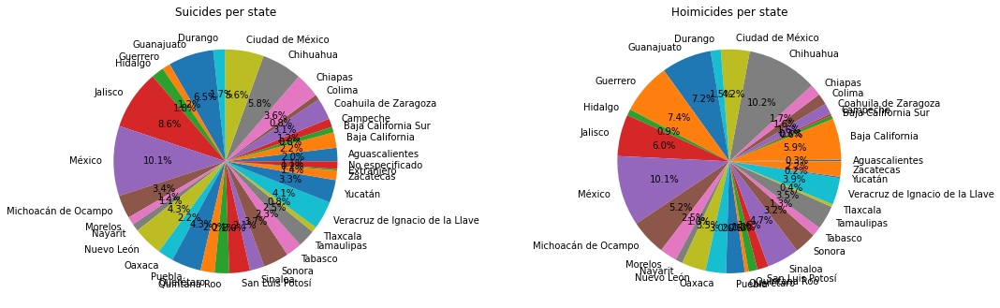

In [ ]:
##Generamos una figura 
fig = plt.figure()
##Indicamos que serpan multiples plots en uno solo output
fig.subplots_adjust(hspace=0.8, wspace=0.8)
##Inidcamos separacion entre subplots h-vertical w-horizontal
fig.set_figwidth(15)
fig.set_figheight(15)
###Indicamos el tamaño de cada figura en solo ese par de lineas

##Indicamos el numero de renglones, columnas, y que subplot será
##Los subplots se cuentan de 1 en adelante, coindiendo con los numero de renglones y columnas indicados 
fig.add_subplot(1,2,1)
#el tipo de plot se indica aquí, con las caracteríticas del tipo de gŕafico
plt.pie(total_s_estado.iloc[:,1:].sum(axis=0), labels = states, autopct='%1.1f%%')
plt.title('Suicides per state')

#Segundo subplot
fig.add_subplot(1,2,2)
plt.pie(total_h_estado.iloc[:,1:].sum(axis=0),  labels = states[:-2], autopct='%1.1f%%')
plt.title('Hoimicides per state')

[Text(0.5, 0, 'Numero de Homicidios'), Text(0, 0.5, 'Entidad federativa')]

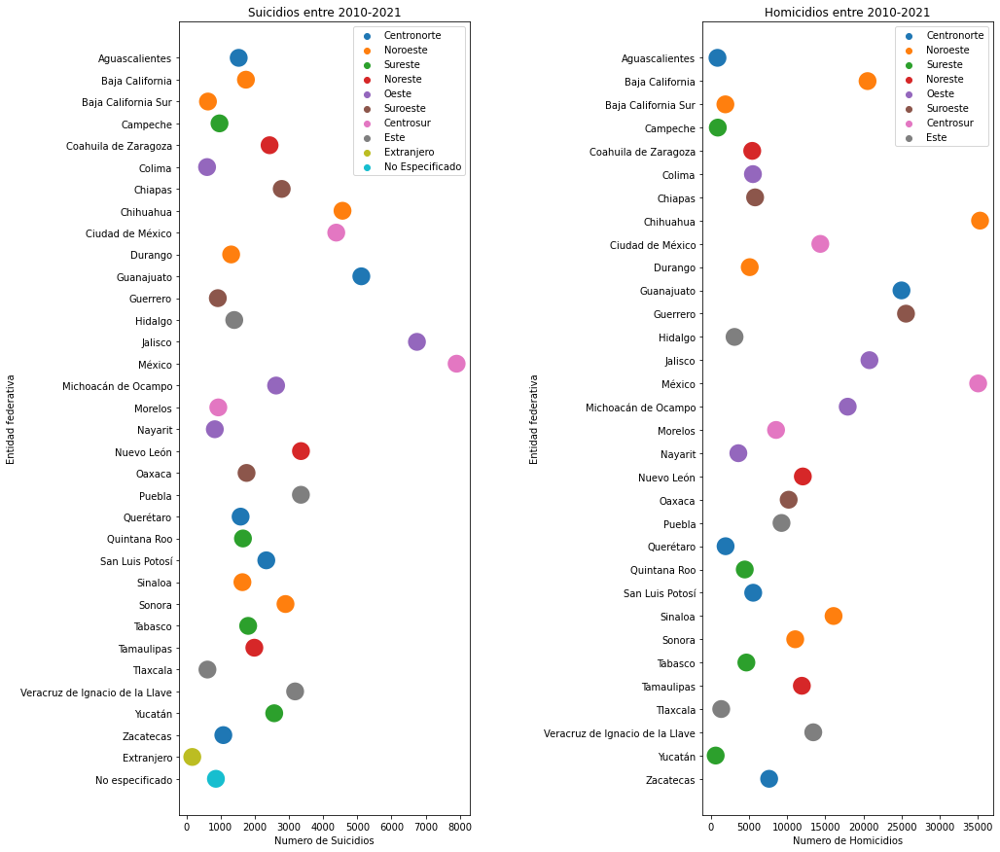

In [ ]:
fig = plt.figure()
fig.subplots_adjust(hspace=0.8, wspace=0.8)
fig.set_figwidth(15)
fig.set_figheight(15)

fig.add_subplot(1,2,1)
g=sns.scatterplot(x=total_s_estado.iloc[:,1:].sum(axis=0),y=states, hue=regiones[1:], s=400)
g.set_title('Suicidios entre 2010-2021')
g.set(xlabel='Numero de Suicidios', ylabel='Entidad federativa')

fig.add_subplot(1,2,2)
g1=sns.scatterplot(x=total_h_estado.iloc[:,1:].sum(axis=0),y=states[:-2], hue=regiones[1:-2], s=400)
g1.set_title('Homicidios entre 2010-2021')
g1.set(xlabel='Numero de Homicidios', ylabel='Entidad federativa')



[Text(0.5, 0, 'Numero de Homicidios'), Text(0, 0.5, 'Entidad federativa')]

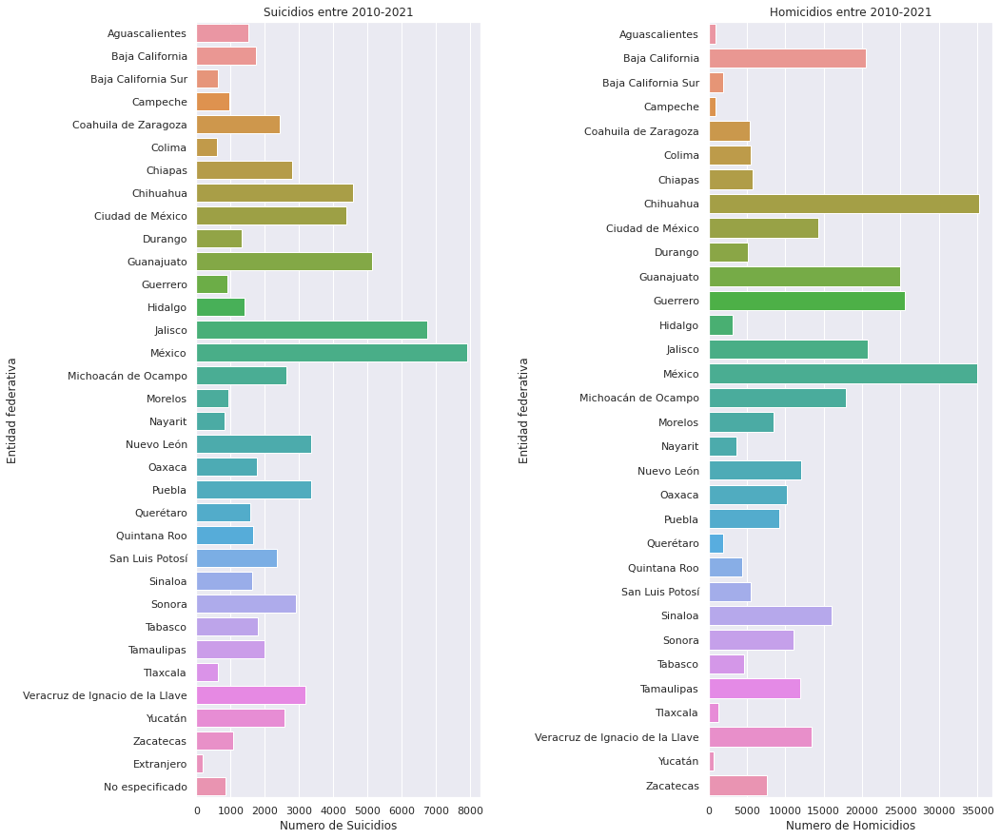

In [ ]:
fig = plt.figure()
fig.subplots_adjust(hspace=0.8, wspace=0.8)
fig.set_figwidth(15)
fig.set_figheight(15)

fig.add_subplot(1,2,1)
g=sns.barplot(x=total_s_estado.iloc[:,1:].sum(axis=0),y=states)
g.set_title('Suicidios entre 2010-2021')
g.set(xlabel='Numero de Suicidios', ylabel='Entidad federativa')

fig.add_subplot(1,2,2)
g1=sns.barplot(x=total_h_estado.iloc[:,1:].sum(axis=0),y=states[:-2])
g1.set_title('Homicidios entre 2010-2021')
g1.set(xlabel='Numero de Homicidios', ylabel='Entidad federativa')



[Text(0.5, 0, 'Numero de Homicidios'), Text(0, 0.5, 'Entidad federativa')]

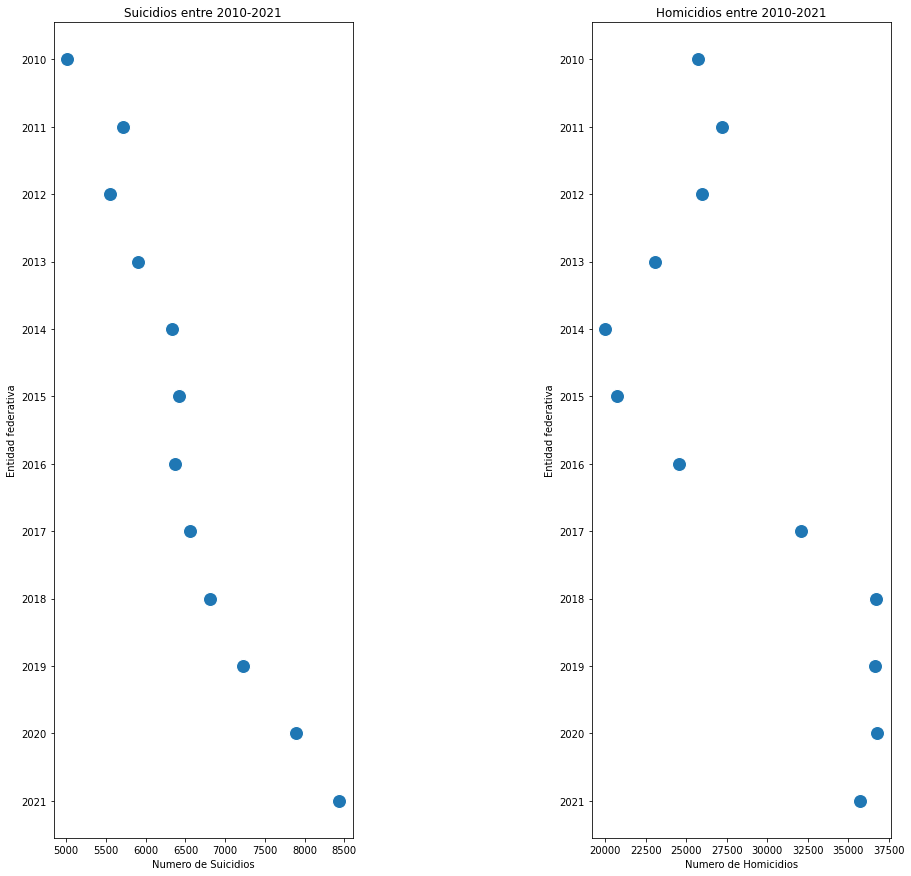

In [ ]:
fig = plt.figure()
fig.subplots_adjust(hspace=0.8, wspace=0.8)
fig.set_figwidth(15)
fig.set_figheight(15)

fig.add_subplot(1,2,1)
g=sns.scatterplot(x=total_s_estado.iloc[:,1:].sum(axis=1),y=years, s=200)
g.set_title('Suicidios entre 2010-2021')
g.set(xlabel='Numero de Suicidios', ylabel='Entidad federativa')

fig.add_subplot(1,2,2)
g1=sns.scatterplot(x=total_h_estado.iloc[:,1:].sum(axis=1),y=years, s=200)
g1.set_title('Homicidios entre 2010-2021')
g1.set(xlabel='Numero de Homicidios', ylabel='Entidad federativa')

[Text(0.5, 0, 'Numero de Suicidios'), Text(0, 0.5, 'Entidad federativa')]

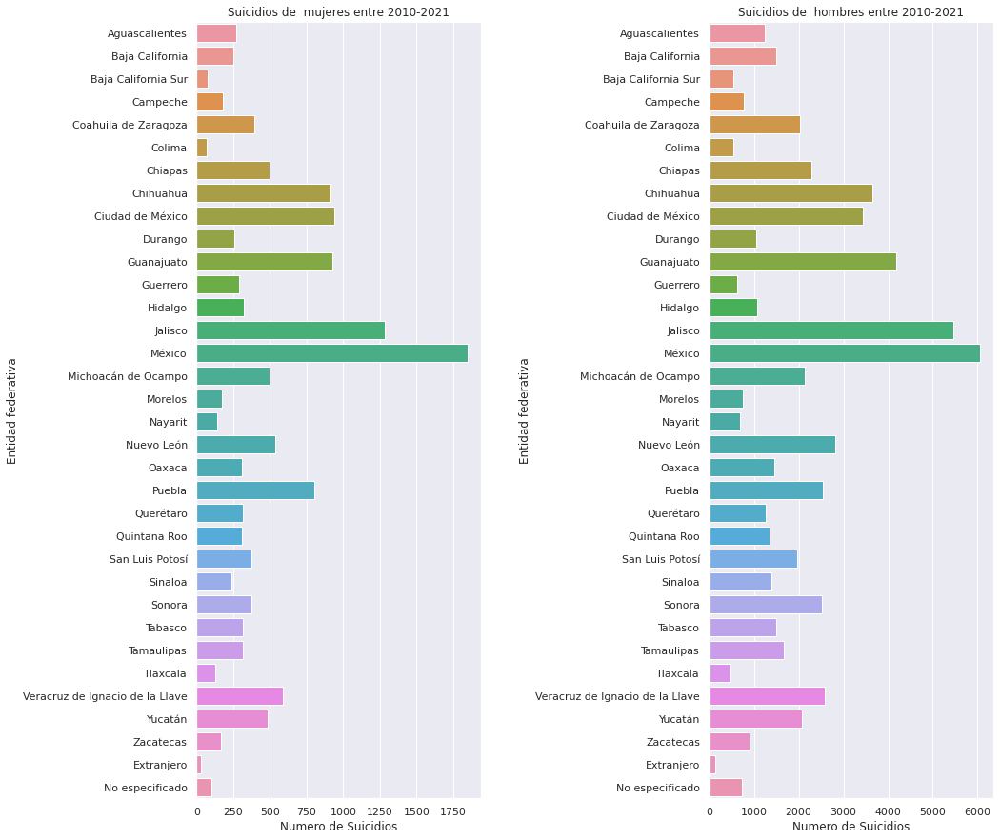

In [ ]:
fig = plt.figure()
fig.subplots_adjust(hspace=0.8, wspace=0.8)
fig.set_figwidth(15)
fig.set_figheight(15)


fig.add_subplot(1,2,1)
sns.set(rc={'figure.figsize':(5,10)})
g = sns.barplot(x=mujeres_s_estado.iloc[:,3:].sum(axis=0),y=states)
g.set_title('Suicidios de  mujeres entre 2010-2021')
g.set(xlabel='Numero de Suicidios', ylabel='Entidad federativa')

fig.add_subplot(1,2,2)
sns.set(rc={'figure.figsize':(5,10)})
g1 = sns.barplot(x=hombres_s_estado.iloc[:,3:].sum(axis=0),y=states)
g1.set_title('Suicidios de  hombres entre 2010-2021')
g1.set(xlabel='Numero de Suicidios', ylabel='Entidad federativa')

[Text(0.5, 0, 'Numero de Homicidios'), Text(0, 0.5, 'Entidad federativa')]

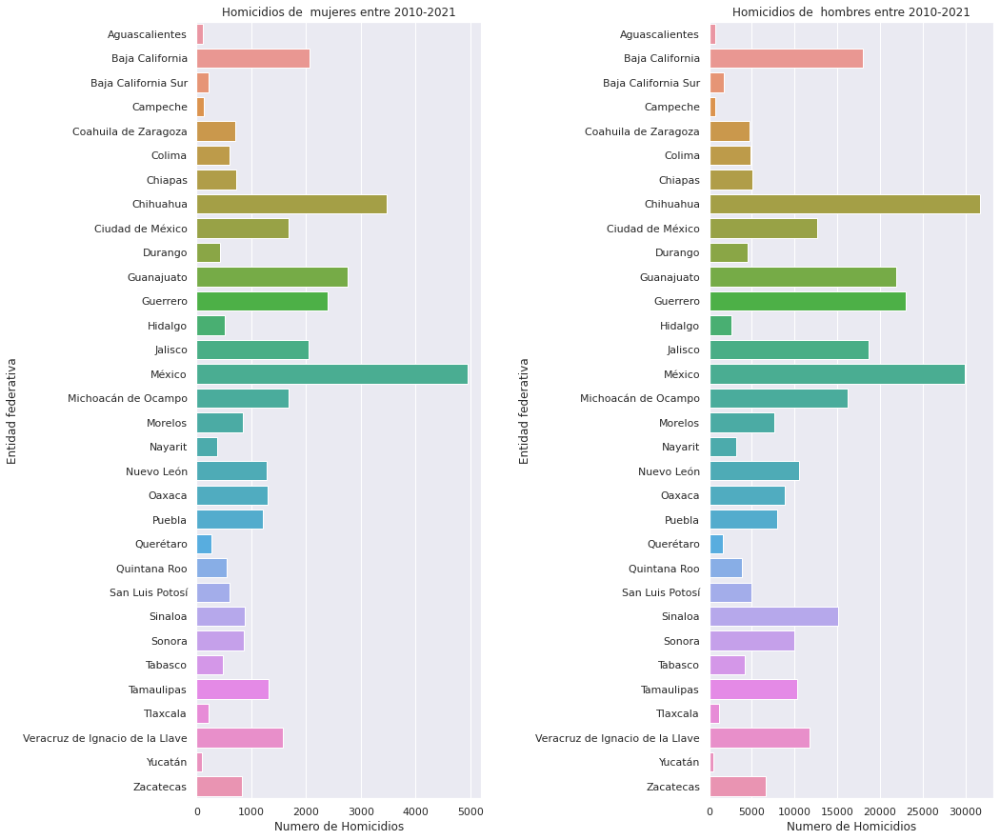

In [ ]:
fig = plt.figure()
fig.subplots_adjust(hspace=0.8, wspace=0.8)
fig.set_figwidth(15)
fig.set_figheight(15)


fig.add_subplot(1,2,1)
sns.set(rc={'figure.figsize':(5,10)})
g = sns.barplot(x=mujeres_h_estado.iloc[:,3:].sum(axis=0),y=states[:-2])
g.set_title('Homicidios de  mujeres entre 2010-2021')
g.set(xlabel='Numero de Homicidios', ylabel='Entidad federativa')

fig.add_subplot(1,2,2)
sns.set(rc={'figure.figsize':(5,10)})
g1 = sns.barplot(x=hombres_h_estado.iloc[:,3:].sum(axis=0),y=states[:-2])
g1.set_title('Homicidios de  hombres entre 2010-2021')
g1.set(xlabel='Numero de Homicidios', ylabel='Entidad federativa')

[Text(0.5, 0, 'Numero de Homicidios'), Text(0, 0.5, 'Entidad federativa')]

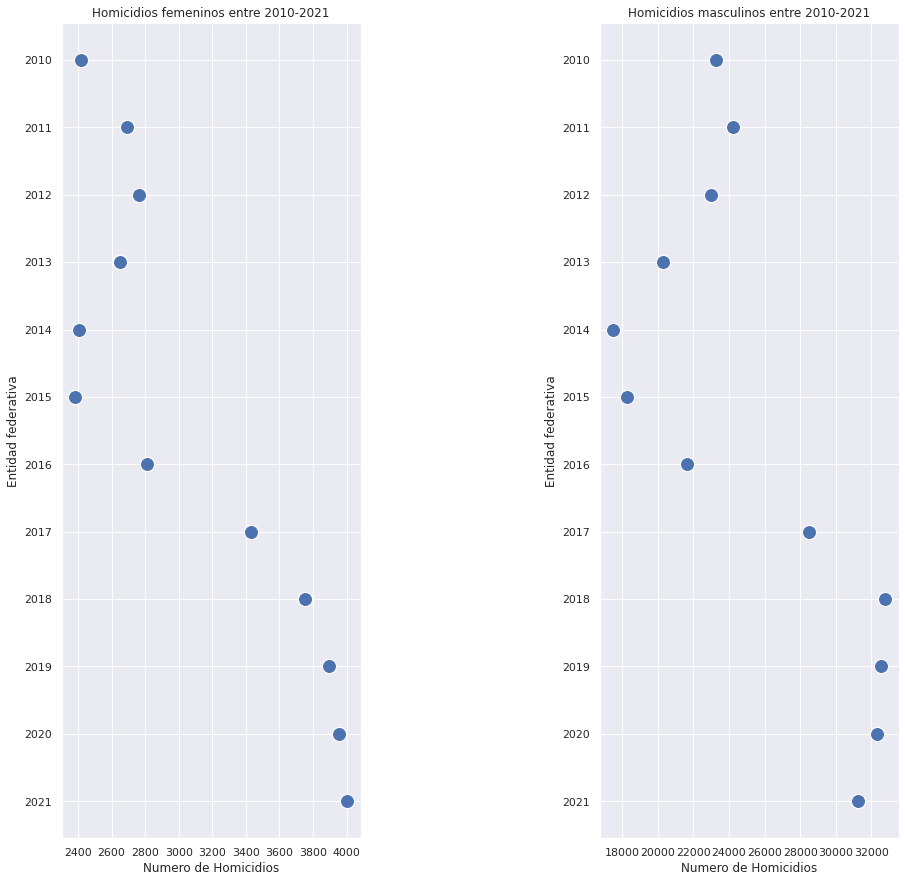

In [ ]:
fig = plt.figure()
fig.subplots_adjust(hspace=0.8, wspace=0.8)
fig.set_figwidth(15)
fig.set_figheight(15)

fig.add_subplot(1,2,1)
g=sns.scatterplot(x=mujeres_h_estado.iloc[:,3:].sum(axis=1),y=years, s=200)
g.set_title('Homicidios femeninos entre 2010-2021')
g.set(xlabel='Numero de Homicidios', ylabel='Entidad federativa')

fig.add_subplot(1,2,2)
g1=sns.scatterplot(x=hombres_h_estado.iloc[:,3:].sum(axis=1),y=years, s=200)
g1.set_title('Homicidios masculinos entre 2010-2021')
g1.set(xlabel='Numero de Homicidios', ylabel='Entidad federativa')

[Text(0.5, 0, 'Numero de Suicidios'), Text(0, 0.5, 'Entidad federativa')]

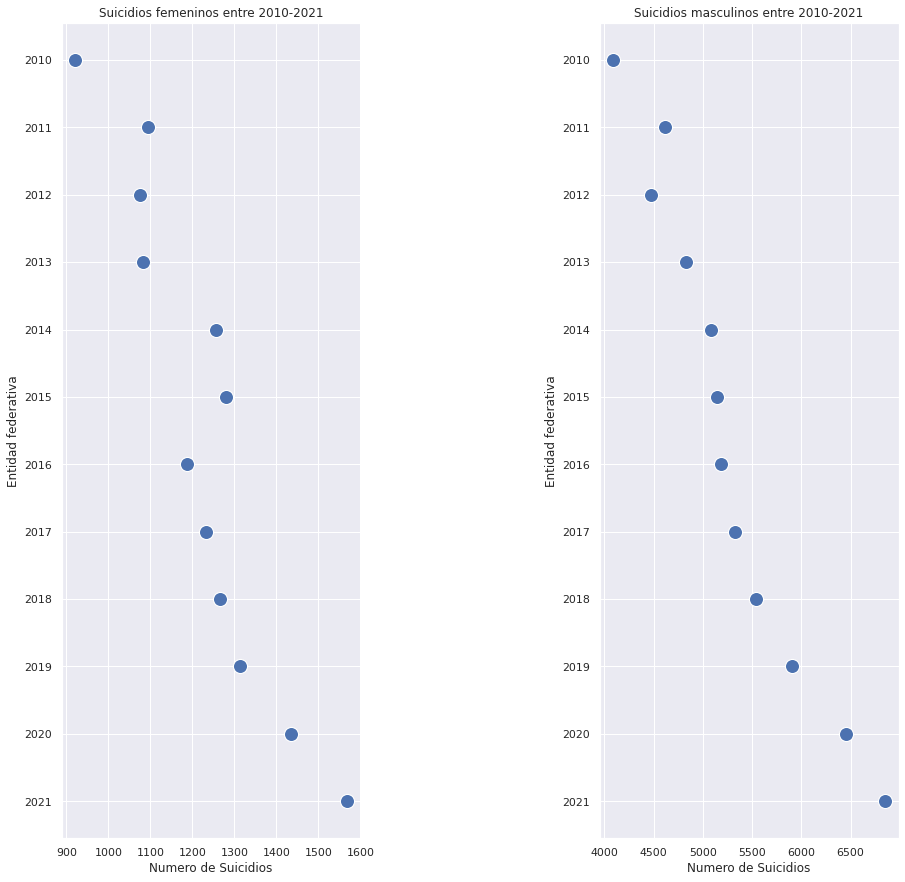

In [ ]:
fig = plt.figure()
fig.subplots_adjust(hspace=0.8, wspace=0.8)
fig.set_figwidth(15)
fig.set_figheight(15)

fig.add_subplot(1,2,1)
g=sns.scatterplot(x=mujeres_s_estado.iloc[:,3:].sum(axis=1),y=years, s=200)
g.set_title('Suicidios femeninos entre 2010-2021')
g.set(xlabel='Numero de Suicidios', ylabel='Entidad federativa')

fig.add_subplot(1,2,2)
g1=sns.scatterplot(x=hombres_s_estado.iloc[:,3:].sum(axis=1),y=years, s=200)
g1.set_title('Suicidios masculinos entre 2010-2021')
g1.set(xlabel='Numero de Suicidios', ylabel='Entidad federativa')

In [ ]:
repo_url = 'https://raw.githubusercontent.com/angelnmara/geojson/master/mexicoHigh.json'
mex_data = requests.get(repo_url).json()

In [ ]:
df_s = pd.DataFrame(total_s_estado.iloc[:,1:].sum(axis=0), columns= ['totals']).reset_index()
df_h = pd.DataFrame(total_h_estado.iloc[:,1:].sum(axis=0), columns= ['totals']).reset_index()

df_h

,Entidad de registro/Homicidios,totals
0,Aguascalientes,866
1,Baja California,20527
2,Baja California Sur,1901
3,Campeche,907
4,Coahuila de Zaragoza,5416
5,Colima,5509
6,Chiapas,5794
7,Chihuahua,35264
8,Ciudad de México,14339
9,Durango,5091


In [ ]:
df_s.iloc[4,0] = 'Coahuila'
df_h.iloc[4,0] = 'Coahuila'
df_s.iloc[15,0] = 'Michoacán'
df_h.iloc[15,0] = 'Michoacán'
df_s.iloc[29,0] = 'Veracruz'
df_h.iloc[29,0] = 'Veracruz'

In [ ]:
df_h

,Entidad de registro/Homicidios,totals
0,Aguascalientes,866
1,Baja California,20527
2,Baja California Sur,1901
3,Campeche,907
4,Coahuila,5416
5,Colima,5509
6,Chiapas,5794
7,Chihuahua,35264
8,Ciudad de México,14339
9,Durango,5091


In [ ]:
fig = px.choropleth(data_frame=df_h, 
                    geojson=mex_data, 
                    locations='Entidad de registro/Homicidios', # name of dataframe column
                    featureidkey='properties.name',  # path to field in GeoJSON feature object with which to match the values passed in to locations
                    color='totals',
                    color_continuous_scale="Magma",
                   )
fig.update_geos(showcountries=True, showcoastlines=True, showland=True, fitbounds="locations")
fig.update_layout(margin={"r":0,"t":0,"l":0,"b":0})
fig.show()

In [ ]:
fig = px.choropleth(data_frame=df_s, 
                    geojson=mex_data, 
                    locations='Entidad de registro/Suicidios', # name of dataframe column
                    featureidkey='properties.name',  # path to field in GeoJSON feature object with which to match the values passed in to locations
                    color='totals',
                    color_continuous_scale="Magma",
                   )
fig.update_geos(showcountries=True, showcoastlines=True, showland=True, fitbounds="locations")
fig.update_layout(margin={"r":0,"t":0,"l":0,"b":0})
fig.show()

# **Conclusiones**


* Se aplicaron los conocimientos de python, estadística, visualización de datos y análisis exploratorio de datos a la base de datos de defunciones obtenida del INEGI.
*   Se observo un aumento en el número de muertes totales para el último periodo de temporal (2019-2021)
*   En comparción de muertes documentadas como suicidios y homicidios, los hombres se ven afectados en un factor 8 veces mayor para homicidios y 4 veces mayor en sucidios al compararlo con las muejeres
*   Existe una tendencia de incremento de ambos tipos de muertes comforme avanza el perido temporal
*   La zona centro sur del pais presenta mayores indices de defunciones
*   Esta misma zona presenta los mayores indices de homicidios y sudicidios. En el caso de los homicidios, la zona noroeste del país presenta un alto número de casos   
*   El Estado de México, es el esta con un mayor indice de suicidos, al tomarlo en conjunto, y al dividrlos por génenro.
*   El Estado de México y Chihuahua presentan los mayores indices de homicidios, al tomarlo en casos totales. Al segmentarlo por género, Chihuaha tiene un mayor número de homicidios masculinos, y el Estado de México tiene el mayor para homicidios femeninos.  





